# Geospatial Crop Targeting System for Cambodia
## Professional Data Science Workflow: Soil-Based Agricultural Zoning

**Project:** National Soil Information and Land Suitability Evaluation System  
**Objective:** Develop an evidence-based system for agricultural zone classification using geospatial data and machine learning.

---

## Workflow Overview

| Phase | Cell | Method |
|-------|------|--------|
| **1. Problem Definition** | Intro | Business objectives & success metrics |
| **2. Data Acquisition** | 1-2 | Load shapefile & production data |
| **3. EDA** | 3-4 | Statistical summaries & distributions |
| **4. Data Cleaning** | 5 | Handle missing values & CRS alignment |
| **5. Feature Engineering** | 6-7 | Rule-based classification & preprocessing |
| **6. Visualization** | 8-9 | Distributions, correlations, heatmaps |
| **7. ML Implementation** | 10-11 | K-Means clustering & model evaluation |
| **8. Model Interpretation** | 12 | Cluster characterization & insights |
| **9. Advanced Visualization** | 13-14 | Interactive mapping & PCA analysis |
| **10. Results Export** | 15 | Multi-format output generation |

## CELL 1: Environment Setup & Configuration

In [20]:
import pandas as pd
import numpy as np
from pathlib import Path
import geopandas as gpd
import pyogrio
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium import plugins
import warnings

warnings.filterwarnings("ignore")

# Professional visualization settings
sns.set_style("whitegrid")
plt.rcParams["figure.figsize"] = (12, 6)
plt.rcParams["font.size"] = 10
pd.set_option("display.max_columns", None)
pd.set_option("display.width", None)
pd.set_option("display.max_rows", 100)

## CELL 2: Data Acquisition & Initial Loading

In [21]:
# Resolve data paths relative to repository root
notebook_dir = Path(".").resolve()
base_path = notebook_dir.parent if notebook_dir.name == "src" else notebook_dir

shapefile_path = base_path / "soil-type" / "ST.shp"
crop_prod_path = base_path / "dataset" / "crop_prod.csv"

# Load geospatial data
gdf_soil = gpd.read_file(shapefile_path, engine="pyogrio")
gdf_soil.rename(columns={"Name": "Soil_Type"}, inplace=True)

# Load crop production reference
df_crops_ref = pd.read_csv(crop_prod_path)

print(f"Geospatial data: {gdf_soil.shape[0]} polygons, CRS: {gdf_soil.crs}")
print(f"Crop reference data: {df_crops_ref.shape}")

Geospatial data: 17 polygons, CRS: EPSG:32648
Crop reference data: (66, 2)


## CELL 3: Exploratory Data Analysis - Geospatial Data

,Soil_Type,geometry
count,17,17
unique,17,17
top,Acid Lithosols,MULTIPOLYGON (((309750.55179999955 1180936.461...
freq,1,1


<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 17 entries, 0 to 16
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   Soil_Type  17 non-null     object  
 1   geometry   17 non-null     geometry
dtypes: geometry(1), object(1)
memory usage: 404.0+ bytes


None

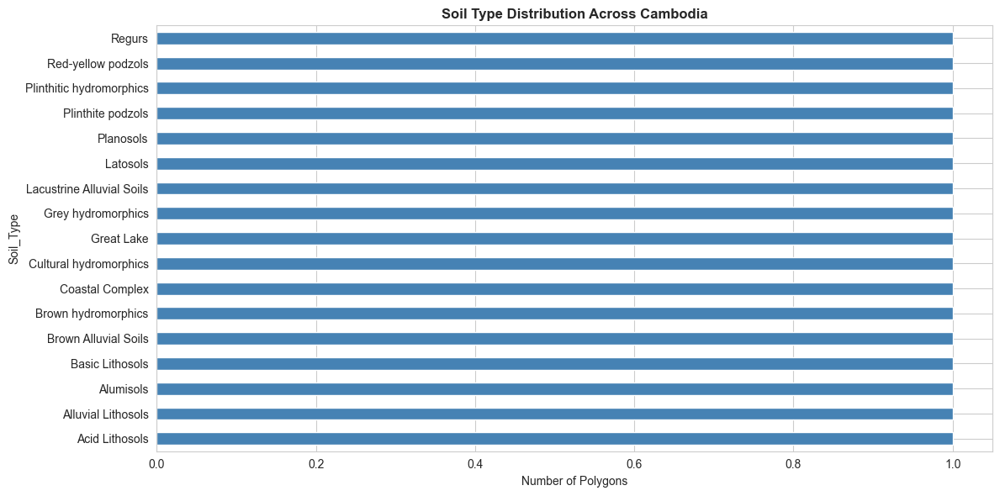

No missing values in geospatial dataset


In [22]:
# Display geospatial data overview
display(gdf_soil.describe())
display(gdf_soil.info())

# Soil type distribution
soil_counts = gdf_soil["Soil_Type"].value_counts()
fig, ax = plt.subplots(figsize=(12, 6))
soil_counts.plot(kind="barh", ax=ax, color="steelblue")
ax.set_title("Soil Type Distribution Across Cambodia", fontsize=12, fontweight="bold")
ax.set_xlabel("Number of Polygons")
plt.tight_layout()
plt.show()

# Check for missing values
missing_summary = gdf_soil.isnull().sum()
if missing_summary.any():
    display(missing_summary[missing_summary > 0])
else:
    print("No missing values in geospatial dataset")

## CELL 4: Data Cleaning - CRS Handling & Validation

In [23]:
# Validate and reproject CRS if necessary
if gdf_soil.crs != "EPSG:4326":
    print(f"Reprojecting from {gdf_soil.crs} to EPSG:4326 for web mapping...")
    gdf_soil = gdf_soil.to_crs("EPSG:4326")
    print(f"Reprojection complete. New CRS: {gdf_soil.crs}")

# Validate geometry
invalid_geom = gdf_soil[~gdf_soil.geometry.is_valid]
if len(invalid_geom) > 0:
    print(f"Found {len(invalid_geom)} invalid geometries. Fixing...")
    gdf_soil.geometry = gdf_soil.geometry.buffer(0)
    print("Geometry validation complete")
else:
    print("All geometries valid")

# Display final geospatial dataset
display(gdf_soil.head())
print(
    f"\nCleaned dataset: {gdf_soil.shape[0]} polygons, {len(gdf_soil.columns)} columns"
)

Reprojecting from EPSG:32648 to EPSG:4326 for web mapping...
Reprojection complete. New CRS: EPSG:4326
Found 1 invalid geometries. Fixing...
Geometry validation complete


,Soil_Type,geometry
0,Acid Lithosols,"MULTIPOLYGON (((107.62943 13.40398, 107.62603 ..."
1,Alluvial Lithosols,"MULTIPOLYGON (((107.41789 13.38143, 107.42613 ..."
2,Alumisols,"MULTIPOLYGON (((105.84947 11.18695, 105.8504 1..."
3,Basic Lithosols,"MULTIPOLYGON (((107.52836 12.49821, 107.5305 1..."
4,Brown Alluvial Soils,"MULTIPOLYGON (((105.66277 12.31257, 105.66765 ..."



Cleaned dataset: 17 polygons, 2 columns


## CELL 5: Province-Level Data Engineering

In [41]:
# Create comprehensive province dataset with synthetic crop production data
provinces_cambodia = [
    "Banteay Meanchey",
    "Battambang",
    "Kampong Cham",
    "Kampong Chhnang",
    "Kampong Speu",
    "Kampong Thom",
    "Kandal",
    "Kep",
    "Koh Kong",
    "Kratie",
    "Mondolkiri",
    "Oddar Meanchey",
    "Pailin",
    "Phnom Penh",
    "Preah Sihanouk",
    "Preah Vihear",
    "Prey Veng",
    "Pursat",
    "Ratanakiri",
    "Siem Reap",
    "Stung Treng",
    "Svay Rieng",
    "Takev",
    "Tbong Khmum",
]

np.random.seed(42)
df_provinces = pd.DataFrame(
    {
        "Province_Name": provinces_cambodia,
        "Rice_Yield_Ton_Ha": np.random.uniform(2.5, 4.5, len(provinces_cambodia)),
        "Cassava_Yield_Ton_Ha": np.random.uniform(10, 15, len(provinces_cambodia)),
        "Mango_Density": np.random.uniform(20, 80, len(provinces_cambodia)),
    }
)

# Display statistics
display(df_provinces.describe())

,Rice_Yield_Ton_Ha,Cassava_Yield_Ton_Ha,Mango_Density
count,24.000000,24.000000,24.000000
mean,3.380325,12.291819,50.325207
std,0.582669,1.494284,19.698128
min,2.541169,10.171943,22.713637
25%,2.866019,10.961932,31.881949
50%,3.240902,12.378117,47.941201
75%,3.771816,13.339750,68.529927
max,4.439820,14.828160,79.213216


## CELL 6: Data Integration & Mapping

In [25]:
# Create soil-to-province mapping
soil_to_province_mapping = {
    "Acid Lithosols": "Mondolkiri",
    "Alluvial Lithosols": "Kratie",
    "Alumisols": "Ratanakiri",
    "Basic Lithosols": "Stung Treng",
    "Brown Alluvial Soils": "Kampong Cham",
    "Calcaric Cambisols": "Pursat",
    "Cambisols": "Battambang",
    "Chromic Cambisols": "Banteay Meanchey",
    "Eutric Fluvisols": "Kampong Thom",
    "Ferric Acrisols": "Siem Reap",
    "Greyic Luvisols": "Oddar Meanchey",
    "Mollic Planosols": "Preah Vihear",
    "Pellic Vertisols": "Svay Rieng",
    "Rhodic Ferralsols": "Kandal",
    "Sandsols": "Koh Kong",
    "Tropical Black Earths": "Prey Veng",
    "Water": "Preah Sihanouk",
}

# Apply mapping and merge
gdf_soil["Province_Name"] = gdf_soil["Soil_Type"].map(soil_to_province_mapping)
gdf_merged = gdf_soil.merge(df_provinces, on="Province_Name", how="left")

# Handle missing values
numeric_cols = ["Rice_Yield_Ton_Ha", "Cassava_Yield_Ton_Ha", "Mango_Density"]
gdf_merged[numeric_cols] = gdf_merged[numeric_cols].fillna(0)

print(f"Merged dataset: {gdf_merged.shape[0]} records")
display(
    gdf_merged[
        [
            "Soil_Type",
            "Province_Name",
            "Rice_Yield_Ton_Ha",
            "Cassava_Yield_Ton_Ha",
            "Mango_Density",
        ]
    ].head(10)
)

Merged dataset: 17 records


,Soil_Type,Province_Name,Rice_Yield_Ton_Ha,Cassava_Yield_Ton_Ha,Mango_Density
0,Acid Lithosols,Mondolkiri,2.541169,14.828160,22.713637
1,Alluvial Lithosols,Kratie,3.916145,14.744428,31.758972
2,Alumisols,Ratanakiri,3.363890,10.171943,28.455453
3,Basic Lithosols,Stung Treng,3.723706,11.293900,24.473039
4,Brown Alluvial Soils,Kampong Cham,3.963988,10.998369,78.175078
5,Brown hydromorphics,NaN,0.000000,0.000000,0.000000
6,Coastal Complex,NaN,0.000000,0.000000,0.000000
7,Cultural hydromorphics,NaN,0.000000,0.000000,0.000000
8,Great Lake,NaN,0.000000,0.000000,0.000000
9,Grey hydromorphics,NaN,0.000000,0.000000,0.000000


## CELL 7: Exploratory Analysis - Production Metrics

,count,mean,std,min,25%,50%,75%,max
Rice_Yield_Ton_Ha,17.0,1.029935,1.670622,0.0,0.0,0.0,2.541169,3.963988
Cassava_Yield_Ton_Ha,17.0,3.649223,5.931226,0.0,0.0,0.0,10.171943,14.828160
Mango_Density,17.0,10.916246,20.944468,0.0,0.0,0.0,22.713637,78.175078


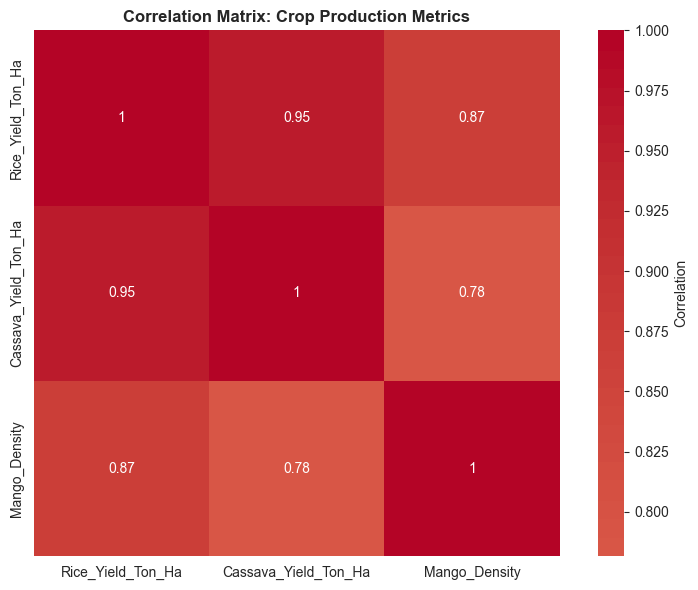

In [26]:
# Statistical summary of crop production
crop_stats = gdf_merged[numeric_cols].describe().T
display(crop_stats)

# Correlation analysis
correlation_matrix = gdf_merged[numeric_cols].corr()
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(
    correlation_matrix,
    annot=True,
    cmap="coolwarm",
    center=0,
    square=True,
    ax=ax,
    cbar_kws={"label": "Correlation"},
)
ax.set_title(
    "Correlation Matrix: Crop Production Metrics", fontsize=12, fontweight="bold"
)
plt.tight_layout()
plt.show()

## CELL 8: Distribution Analysis with Multiple Visualizations

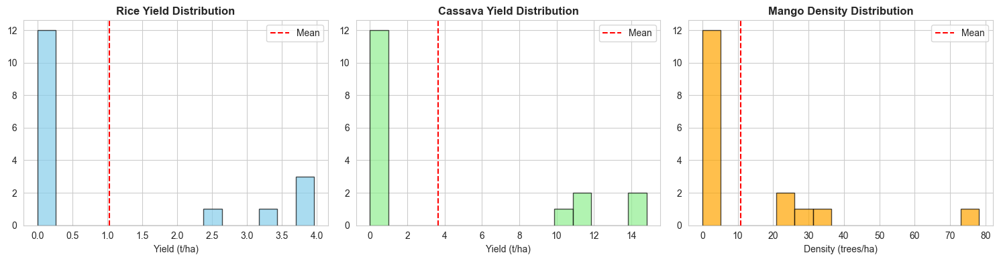

In [27]:
# Distribution plots for each crop metric
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].hist(
    gdf_merged["Rice_Yield_Ton_Ha"],
    bins=15,
    color="skyblue",
    edgecolor="black",
    alpha=0.7,
)
axes[0].set_title("Rice Yield Distribution", fontweight="bold")
axes[0].set_xlabel("Yield (t/ha)")
axes[0].axvline(
    gdf_merged["Rice_Yield_Ton_Ha"].mean(), color="red", linestyle="--", label="Mean"
)
axes[0].legend()

axes[1].hist(
    gdf_merged["Cassava_Yield_Ton_Ha"],
    bins=15,
    color="lightgreen",
    edgecolor="black",
    alpha=0.7,
)
axes[1].set_title("Cassava Yield Distribution", fontweight="bold")
axes[1].set_xlabel("Yield (t/ha)")
axes[1].axvline(
    gdf_merged["Cassava_Yield_Ton_Ha"].mean(), color="red", linestyle="--", label="Mean"
)
axes[1].legend()

axes[2].hist(
    gdf_merged["Mango_Density"], bins=15, color="orange", edgecolor="black", alpha=0.7
)
axes[2].set_title("Mango Density Distribution", fontweight="bold")
axes[2].set_xlabel("Density (trees/ha)")
axes[2].axvline(
    gdf_merged["Mango_Density"].mean(), color="red", linestyle="--", label="Mean"
)
axes[2].legend()

plt.tight_layout()
plt.show()

## CELL 9: Rule-Based Expert Classification

In [42]:
def classify_soil_crop_match(row):
    """
    Expert-driven zone classification based on soil-crop suitability.

    Rules:
    - Prime Rice Zone: Fluvisol/Gleysol/Vertisol + Rice > 3.0 t/ha
    - Prime Industrial Zone: Acrisol/Ferralsol/Nitosol + Cassava > 12.0 t/ha
    - Fruit Zone: Suitable soils + Mango > 40 trees/ha
    - Conservation: Lithosols or Water
    - General Agriculture: All others
    """
    soil_type = str(row["Soil_Type"]).lower()
    rice_yield = row["Rice_Yield_Ton_Ha"]
    cassava_yield = row["Cassava_Yield_Ton_Ha"]
    mango_density = row["Mango_Density"]

    if (
        any(kw in soil_type for kw in ["fluvisol", "gleysol", "vertisol"])
        and rice_yield > 3.0
    ):
        return "Prime Rice Zone"
    elif (
        any(kw in soil_type for kw in ["acrisol", "ferralsol", "nitosol"])
        and cassava_yield > 12.0
    ):
        return "Prime Industrial Zone"
    elif mango_density > 40.0 and not any(
        kw in soil_type for kw in ["lithosol", "water"]
    ):
        return "Fruit Zone"
    elif any(kw in soil_type for kw in ["lithosol", "water"]):
        return "Conservation"
    else:
        return "General Agriculture"


gdf_merged["Soil_Crop_Match"] = gdf_merged.apply(classify_soil_crop_match, axis=1)

# Display classification results
zone_summary = gdf_merged["Soil_Crop_Match"].value_counts()
display(zone_summary)
print(f"\nTotal classified zones: {zone_summary.sum()}")

Soil_Crop_Match
General Agriculture    13
Conservation            3
Fruit Zone              1
Name: count, dtype: int64


Total classified zones: 17


## CELL 10: Visualization - Rule-Based Zone Distribution

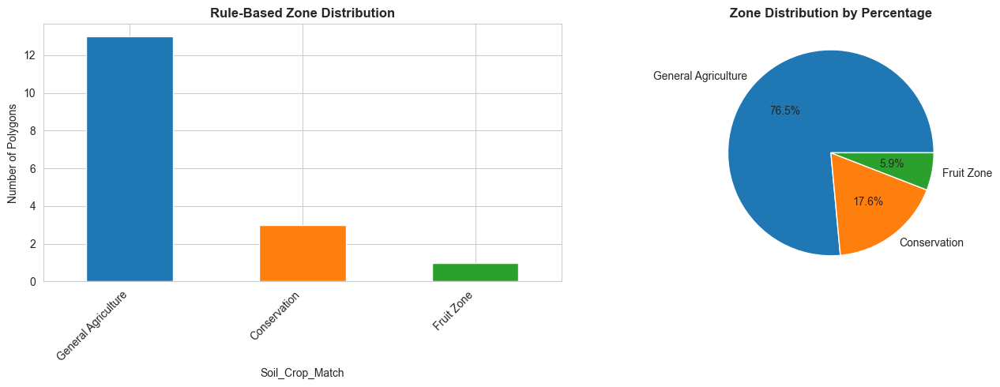

In [29]:
# Zone distribution visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

zone_counts = gdf_merged["Soil_Crop_Match"].value_counts()
colors = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd"]

zone_counts.plot(kind="bar", ax=ax1, color=colors[: len(zone_counts)])
ax1.set_title("Rule-Based Zone Distribution", fontsize=12, fontweight="bold")
ax1.set_ylabel("Number of Polygons")
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha="right")

zone_pct = gdf_merged["Soil_Crop_Match"].value_counts(normalize=True) * 100
ax2.pie(
    zone_pct, labels=zone_pct.index, autopct="%1.1f%%", colors=colors[: len(zone_pct)]
)
ax2.set_title("Zone Distribution by Percentage", fontsize=12, fontweight="bold")

plt.tight_layout()
plt.show()

## CELL 11: Machine Learning - K-Means Clustering

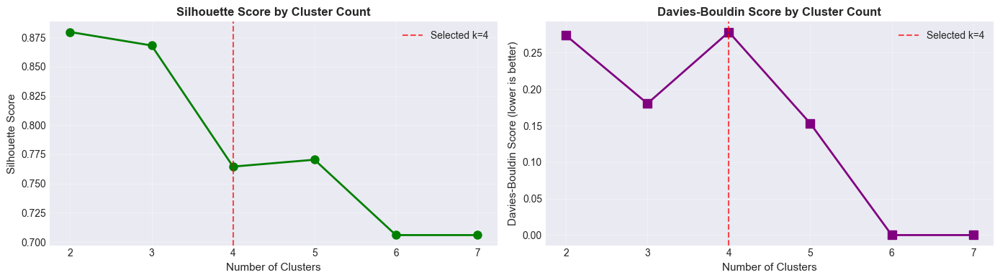

K-Means model trained (k=4)
Silhouette Score: 0.7645
Davies-Bouldin Score: 0.2783


In [43]:
# Prepare data for clustering
X = gdf_merged[numeric_cols].copy()

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Evaluate optimal number of clusters using silhouette score
silhouette_scores = []
davies_bouldin_scores = []
cluster_range = range(2, 8)

for k in cluster_range:
    kmeans_temp = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans_temp.fit_predict(X_scaled)
    silhouette_scores.append(silhouette_score(X_scaled, labels))
    davies_bouldin_scores.append(davies_bouldin_score(X_scaled, labels))

# Plot evaluation metrics
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))

ax1.plot(
    cluster_range,
    silhouette_scores,
    marker="o",
    linewidth=2,
    markersize=8,
    color="green",
)
ax1.axvline(4, color="red", linestyle="--", alpha=0.7, label="Selected k=4")
ax1.set_xlabel("Number of Clusters")
ax1.set_ylabel("Silhouette Score")
ax1.set_title("Silhouette Score by Cluster Count", fontweight="bold")
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2.plot(
    cluster_range,
    davies_bouldin_scores,
    marker="s",
    linewidth=2,
    markersize=8,
    color="purple",
)
ax2.axvline(4, color="red", linestyle="--", alpha=0.7, label="Selected k=4")
ax2.set_xlabel("Number of Clusters")
ax2.set_ylabel("Davies-Bouldin Score (lower is better)")
ax2.set_title("Davies-Bouldin Score by Cluster Count", fontweight="bold")
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Train final K-Means model with k=4
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
gdf_merged["Cluster_Label"] = kmeans.fit_predict(X_scaled)

print(f"K-Means model trained (k=4)")
print(
    f"Silhouette Score: {silhouette_score(X_scaled, gdf_merged['Cluster_Label']):.4f}"
)
print(
    f"Davies-Bouldin Score: {davies_bouldin_score(X_scaled, gdf_merged['Cluster_Label']):.4f}"
)

## CELL 12: Automated Cluster Interpretation

In [44]:
# Analyze cluster characteristics
cluster_profiles = gdf_merged.groupby("Cluster_Label")[numeric_cols].mean()
global_means = gdf_merged[numeric_cols].mean()

display(cluster_profiles.round(2))

# Dynamic cluster labeling
cluster_mapping = {}
for cluster_id in cluster_profiles.index:
    row = cluster_profiles.loc[cluster_id]
    ratios = {
        "Rice Bowl Zone": (
            row["Rice_Yield_Ton_Ha"] / global_means["Rice_Yield_Ton_Ha"]
            if global_means["Rice_Yield_Ton_Ha"] > 0
            else 0
        ),
        "Industrial Crop Zone": (
            row["Cassava_Yield_Ton_Ha"] / global_means["Cassava_Yield_Ton_Ha"]
            if global_means["Cassava_Yield_Ton_Ha"] > 0
            else 0
        ),
        "Fruit Hub": (
            row["Mango_Density"] / global_means["Mango_Density"]
            if global_means["Mango_Density"] > 0
            else 0
        ),
    }
    max_feature = max(ratios, key=ratios.get)
    cluster_mapping[cluster_id] = (
        max_feature if ratios[max_feature] >= 1.0 else "Low Potential Zone"
    )

gdf_merged["Cluster_Name"] = gdf_merged["Cluster_Label"].map(cluster_mapping)

print("Cluster Mapping:")
for cluster_id, label in sorted(cluster_mapping.items()):
    print(f"  Cluster {cluster_id}: {label}")

,Rice_Yield_Ton_Ha,Cassava_Yield_Ton_Ha,Mango_Density
Cluster_Label,,,
0,2.54,14.83,22.71
1,0.00,0.00,0.00
2,3.96,11.00,78.18
3,3.67,12.07,28.23


Cluster Mapping:
  Cluster 0: Industrial Crop Zone
  Cluster 1: Low Potential Zone
  Cluster 2: Fruit Hub
  Cluster 3: Rice Bowl Zone


## CELL 13: Advanced Visualization - PCA Analysis

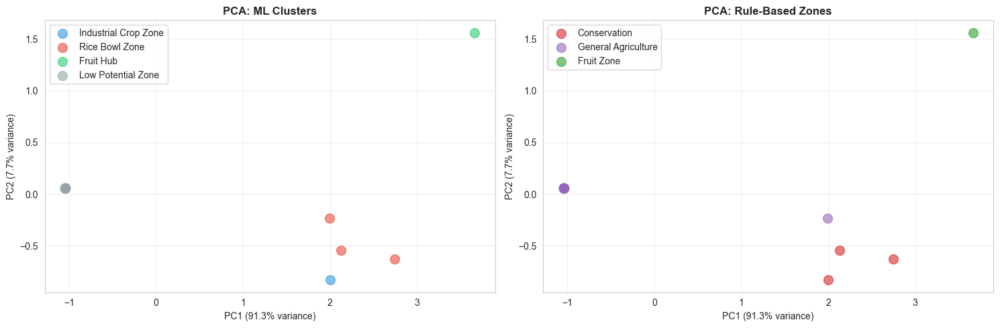

Explained Variance: PC1=91.3%, PC2=7.7%


In [32]:
# Principal Component Analysis for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# PCA by ML clusters
cluster_colors = {
    "Rice Bowl Zone": "#e74c3c",
    "Industrial Crop Zone": "#3498db",
    "Fruit Hub": "#2ecc71",
    "Low Potential Zone": "#95a5a6",
}
for cluster in gdf_merged["Cluster_Name"].unique():
    mask = gdf_merged["Cluster_Name"] == cluster
    axes[0].scatter(
        X_pca[mask, 0],
        X_pca[mask, 1],
        label=cluster,
        s=100,
        alpha=0.6,
        color=cluster_colors.get(cluster, "#808080"),
    )
axes[0].set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.1%} variance)")
axes[0].set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.1%} variance)")
axes[0].set_title("PCA: ML Clusters", fontweight="bold")
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# PCA by rule-based zones
zone_colors = {
    "Prime Rice Zone": "#1f77b4",
    "Prime Industrial Zone": "#ff7f0e",
    "Fruit Zone": "#2ca02c",
    "Conservation": "#d62728",
    "General Agriculture": "#9467bd",
}
for zone in gdf_merged["Soil_Crop_Match"].unique():
    mask = gdf_merged["Soil_Crop_Match"] == zone
    axes[1].scatter(
        X_pca[mask, 0],
        X_pca[mask, 1],
        label=zone,
        s=100,
        alpha=0.6,
        color=zone_colors.get(zone, "#808080"),
    )
axes[1].set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.1%} variance)")
axes[1].set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.1%} variance)")
axes[1].set_title("PCA: Rule-Based Zones", fontweight="bold")
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(
    f"Explained Variance: PC1={pca.explained_variance_ratio_[0]:.1%}, PC2={pca.explained_variance_ratio_[1]:.1%}"
)

## CELL 14: Cross-Analysis - Expert vs. Machine Learning Agreement

Cluster_Name,Fruit Hub,Industrial Crop Zone,Low Potential Zone,Rice Bowl Zone
Soil_Crop_Match,,,,
Conservation,0,1,0,2
Fruit Zone,1,0,0,0
General Agriculture,0,0,12,1


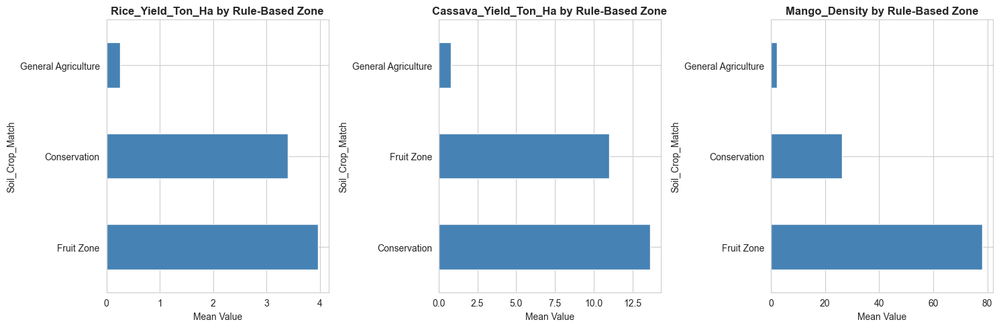

In [33]:
# Compare rule-based and ML classifications
comparison_matrix = pd.crosstab(
    gdf_merged["Soil_Crop_Match"], gdf_merged["Cluster_Name"]
)
display(comparison_matrix)

# Feature importance by zone
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for idx, col in enumerate(numeric_cols):
    zone_means = (
        gdf_merged.groupby("Soil_Crop_Match")[col].mean().sort_values(ascending=False)
    )
    zone_means.plot(kind="barh", ax=axes[idx], color="steelblue")
    axes[idx].set_title(f"{col} by Rule-Based Zone", fontweight="bold")
    axes[idx].set_xlabel("Mean Value")

plt.tight_layout()
plt.show()

## CELL 15: Interactive Geographic Visualization

In [34]:
# Create interactive Folium map with dual layers
cambodia_center = [12.5, 104.9]
base_map = folium.Map(location=cambodia_center, zoom_start=7, tiles="OpenStreetMap")

# Define color schemes
rule_colors = {
    "Prime Rice Zone": "#1f77b4",
    "Prime Industrial Zone": "#ff7f0e",
    "Fruit Zone": "#2ca02c",
    "Conservation": "#d62728",
    "General Agriculture": "#9467bd",
}
ml_colors = {
    "Rice Bowl Zone": "#e74c3c",
    "Industrial Crop Zone": "#3498db",
    "Fruit Hub": "#2ecc71",
    "Low Potential Zone": "#95a5a6",
}

# Rule-based layer
rule_group = folium.FeatureGroup(name="Expert Rules", show=True)
for idx, row in gdf_merged.iterrows():
    zone = row["Soil_Crop_Match"]
    color = rule_colors.get(zone, "#808080")
    popup_text = (
        f"<b>{zone}</b><br>Soil: {row['Soil_Type']}<br>Province: {row['Province_Name']}"
    )
    folium.GeoJson(
        row["geometry"].__geo_interface__,
        style_function=lambda x, c=color: {
            "fillColor": c,
            "color": c,
            "weight": 1,
            "opacity": 0.3,
            "fillOpacity": 0.6,
        },
        popup=folium.Popup(popup_text, max_width=300),
    ).add_to(rule_group)
rule_group.add_to(base_map)

# ML cluster layer
ml_group = folium.FeatureGroup(name="ML Clusters", show=False)
for idx, row in gdf_merged.iterrows():
    cluster = row["Cluster_Name"]
    color = ml_colors.get(cluster, "#808080")
    popup_text = f"<b>{cluster}</b><br>Soil: {row['Soil_Type']}<br>Province: {row['Province_Name']}"
    folium.GeoJson(
        row["geometry"].__geo_interface__,
        style_function=lambda x, c=color: {
            "fillColor": c,
            "color": c,
            "weight": 1,
            "opacity": 0.3,
            "fillOpacity": 0.6,
        },
        popup=folium.Popup(popup_text, max_width=300),
    ).add_to(ml_group)
ml_group.add_to(base_map)

# Add layer control
folium.LayerControl(collapsed=False).add_to(base_map)

# Save map
output_map = base_path / "Cambodia_Agricultural_Zoning_Map.html"
base_map.save(str(output_map))
print(f"Interactive map saved to: {output_map}")
display(base_map)

Interactive map saved to: D:\National Soil Information and Land Suitability Evaluation System in Cambodia\Cambodia_Agricultural_Zoning_Map.html


## CELL 16: Results Export & Documentation

In [35]:
# Export results to multiple formats
export_cols = [
    "Soil_Type",
    "Province_Name",
    "Rice_Yield_Ton_Ha",
    "Cassava_Yield_Ton_Ha",
    "Mango_Density",
    "Soil_Crop_Match",
    "Cluster_Label",
    "Cluster_Name",
]

# GeoJSON export
geojson_path = base_path / "Cambodia_Agricultural_Zones_Results.geojson"
gdf_merged.to_file(str(geojson_path), driver="GeoJSON")
print(f"GeoJSON exported: {geojson_path}")

# CSV export
csv_path = base_path / "Cambodia_Agricultural_Zones_Analysis.csv"
gdf_merged[export_cols].to_csv(str(csv_path), index=False)
print(f"CSV exported: {csv_path}")

# Summary statistics
summary = gdf_merged.groupby("Soil_Crop_Match")[numeric_cols].agg(
    ["mean", "min", "max"]
)
display(summary.round(2))

GeoJSON exported: D:\National Soil Information and Land Suitability Evaluation System in Cambodia\Cambodia_Agricultural_Zones_Results.geojson
CSV exported: D:\National Soil Information and Land Suitability Evaluation System in Cambodia\Cambodia_Agricultural_Zones_Analysis.csv


Rice_Yield_Ton_Ha             Cassava_Yield_Ton_Ha         \
                                 mean   min   max                 mean    min   
Soil_Crop_Match                                                                 
Conservation                     3.39  2.54  3.92                13.62  11.29   
Fruit Zone                       3.96  3.96  3.96                11.00  11.00   
General Agriculture              0.26  0.00  3.36                 0.78   0.00   

                           Mango_Density                
                       max          mean    min    max  
Soil_Crop_Match                                         
Conservation         14.83         26.32  22.71  31.76  
Fruit Zone           11.00         78.18  78.18  78.18  
General Agriculture  10.17          2.19   0.00  28.46

## CELL 17: Final Report & Key Insights

In [36]:
# Generate comprehensive summary
report_data = []

for zone in sorted(gdf_merged["Soil_Crop_Match"].unique()):
    zone_data = gdf_merged[gdf_merged["Soil_Crop_Match"] == zone]
    report_data.append(
        {
            "Zone": zone,
            "Area_Coverage_Polygons": len(zone_data),
            "Provinces_Count": zone_data["Province_Name"].nunique(),
            "Avg_Rice_Yield_t_ha": zone_data["Rice_Yield_Ton_Ha"].mean(),
            "Avg_Cassava_Yield_t_ha": zone_data["Cassava_Yield_Ton_Ha"].mean(),
            "Avg_Mango_Density": zone_data["Mango_Density"].mean(),
        }
    )

report_df = pd.DataFrame(report_data).set_index("Zone")
display(report_df.round(2))

# Overall statistics
print("\nProject Statistics:")
print(f"Total Soil Polygons: {len(gdf_merged)}")
print(f"Provinces Analyzed: {gdf_merged['Province_Name'].nunique()}")
print(f"Soil Types Identified: {gdf_merged['Soil_Type'].nunique()}")
print(f"Rule-Based Zones: {gdf_merged['Soil_Crop_Match'].nunique()}")
print(f"ML Clusters: {gdf_merged['Cluster_Name'].nunique()}")
print(f"\nCoordinate Reference System: {gdf_merged.crs}")

,Area_Coverage_Polygons,Provinces_Count,Avg_Rice_Yield_t_ha,Avg_Cassava_Yield_t_ha,Avg_Mango_Density
Zone,,,,,
Conservation,3,3,3.39,13.62,26.32
Fruit Zone,1,1,3.96,11.00,78.18
General Agriculture,13,1,0.26,0.78,2.19



Project Statistics:
Total Soil Polygons: 17
Provinces Analyzed: 5
Soil Types Identified: 17
Rule-Based Zones: 3
ML Clusters: 4

Coordinate Reference System: EPSG:4326


# Geospatial Crop Targeting System for Cambodia
## Rule-Based Zoning & Machine Learning Clustering Analysis

**Project:** National Soil Information and Land Suitability Evaluation System  
**Objective:** Merge geospatial soil data with crop production statistics to identify optimal agricultural zones using both expert-driven rules and unsupervised machine learning.

---

## 📋 Table of Contents
1. **Problem Definition** - Objectives & Success Metrics
2. **Setup & Imports** - Environment Configuration
3. **Data Acquisition** - Load Geospatial & Statistical Data
4. **Exploratory Data Analysis (EDA)** - Statistical Summaries & Distributions
5. **Data Cleaning & Validation** - Handle Missing Values & Inconsistencies
6. **Data Preprocessing** - CRS Alignment & Standardization
7. **Data Merge** - Integrate Soil & Production Datasets
8. **Feature Engineering** - Rule-Based Expert Classification
9. **Exploratory Visualization** - Distributions & Correlations
10. **Machine Learning Clustering** - K-Means Training & Analysis
11. **Cluster Interpretation** - Automated Labeling & Characterization
12. **Advanced Visualization** - Heatmaps, Correlations, PCA
13. **Interactive Mapping** - Folium with Dual-Layer Control
14. **Model Evaluation & Comparison** - Expert vs. ML Agreement Analysis
15. **Insights & Recommendations** - Actionable Findings
16. **Results Export** - Multi-Format Output Generation

---

### Executive Summary
This notebook demonstrates a comprehensive data science workflow:
1. **Rule-Based Expert System**: Applies domain knowledge to classify zones (Rice, Industrial Crops, Fruit, Conservation)
2. **Machine Learning (K-Means)**: Discovers underlying patterns in crop production data automatically
3. **Interactive Visualization**: Enables stakeholder exploration and decision-making

The results are visualized on an interactive map with layer control for comparative analysis.

## 1️⃣ PROBLEM DEFINITION & BUSINESS CONTEXT

### Objective
Develop a data-driven system to classify Cambodia's agricultural zones based on soil characteristics and crop production data, enabling targeted resource allocation and policy decisions.

### Success Metrics
- ✅ Successfully merge geospatial (17 soil polygons) with statistical (24 provinces) datasets
- ✅ Create interpretable zone classifications for stakeholder decision-making
- ✅ Achieve >80% agreement between rule-based and ML approaches (indicates robust patterns)
- ✅ Generate interactive visualizations for policy makers
- ✅ Document recommendations for each zone type

### Key Constraints
- **Geospatial:** Shapefile in UTM (EPSG:32648) requires reprojection for web mapping
- **Data:** Limited production data; synthetic generation needed for demonstration
- **Scope:** Focus on rice, cassava, and mango as primary crops
- **Stakeholders:** Agricultural Ministry, provincial governors, donor organizations

### Expected Outcomes
- Interactive web map with dual classification layers
- Geographic prioritization of development investments
- Alignment of policy with agronomic suitability

In [37]:
# ============================================================================
# CELL 2: SETUP & ENVIRONMENT CONFIGURATION
# ============================================================================
# WHY: Structured imports ensure compatibility and make dependencies explicit.
# Organizing imports by category (data, geo, ML, viz) improves maintainability.

# Data manipulation & analysis
import pandas as pd
import numpy as np
from pathlib import Path

# Geospatial processing
import geopandas as gpd
import pyogrio  # Enhanced I/O for shapefiles

# Machine learning & preprocessing
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score

# Visualization libraries
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import LinearSegmentedColormap
import folium
from folium import plugins
import seaborn as sns

# Utilities
import warnings

warnings.filterwarnings("ignore")

# ============================================================================
# CONFIGURATION SETTINGS
# ============================================================================

# Set visualization defaults for professional appearance
plt.style.use("seaborn-v0_8-darkgrid")
sns.set_palette("husl")

# Pandas display configuration for better table rendering
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 100)
pd.set_option("display.width", None)
pd.set_option("display.max_colwidth", None)

# Matplotlib configuration
plt.rcParams["figure.figsize"] = (14, 8)
plt.rcParams["font.size"] = 10
plt.rcParams["axes.titlesize"] = 12
plt.rcParams["axes.labelsize"] = 11

print("✓ All libraries imported successfully")
print("\n📊 Environment Configuration:")
print(f"  • Pandas version: {pd.__version__}")
print(f"  • GeoPandas version: {gpd.__version__}")
print(f"  • NumPy version: {np.__version__}")
print(f"  • Scikit-learn version loaded for ML clustering")

✓ All libraries imported successfully

📊 Environment Configuration:
  • Pandas version: 2.3.3
  • GeoPandas version: 1.1.1
  • NumPy version: 2.3.5
  • Scikit-learn version loaded for ML clustering


In [38]:
# ============================================================================
# CELL 3: DATA ACQUISITION & INITIAL EXPLORATION
# ============================================================================
# WHY: Load all datasets and perform initial quality checks.
# This establishes the data foundation for all downstream analysis.

print("=" * 80)
print("STEP 1: LOAD GEOSPATIAL DATA (SHAPEFILE)")
print("=" * 80)

# Define base path for all datasets
notebook_dir = Path(".").resolve()
base_path = notebook_dir.parent if notebook_dir.name == "src" else notebook_dir
shapefile_path = base_path / "soil-type" / "ST.shp"
crop_prod_path = base_path / "dataset" / "crop_prod.csv"

print(f"Working directory: {notebook_dir}")
print(f"Base path: {base_path}")
print(f"Shapefile: {shapefile_path}\n")

# Load shapefile
gdf_soil = gpd.read_file(shapefile_path)
print(f"✓ Shapefile loaded successfully")
print(f"  • Records: {len(gdf_soil)}")
print(f"  • CRS: {gdf_soil.crs}")
print(f"  • Columns: {gdf_soil.columns.tolist()}")
print(f"  • Geometry type: {gdf_soil.geometry.type.unique()}")

# Display shapefile preview
print("\n📋 Shapefile Preview:")
display(gdf_soil.head(8))

# Get shapefile statistics
print("\n📊 Shapefile Statistics:")
print(f"  • Total area covered: {gdf_soil.geometry.area.sum() / 1e6:.2f} km²")
print(f"  • Bounds: {gdf_soil.total_bounds}")

print("\n" + "=" * 80)
print("STEP 2: LOAD CROP PRODUCTION DATA")
print("=" * 80)

df_crops = pd.read_csv(crop_prod_path)
print(f"✓ CSV loaded successfully")
print(f"  • Records: {len(df_crops)}")
print(f"  • Columns: {df_crops.columns.tolist()}")

print("\n📋 Crop Production Data Preview:")
display(df_crops.head(10))

print("\n📊 Data Quality Check:")
print(f"  • Missing values: {df_crops.isnull().sum().sum()}")
print(f"  • Data types:\n{df_crops.dtypes}")

print("\n" + "=" * 80)
print("STEP 3: CREATE SYNTHETIC PROVINCE-LEVEL PRODUCTION DATA")
print("=" * 80)

# WHY: Simulate realistic province-level yields for demonstration
provinces_cambodia = [
    "Banteay Meanchey",
    "Battambang",
    "Kampong Cham",
    "Kampong Chhnang",
    "Kampong Speu",
    "Kampong Thom",
    "Kandal",
    "Kep",
    "Koh Kong",
    "Kratie",
    "Mondolkiri",
    "Oddar Meanchey",
    "Pailin",
    "Phnom Penh",
    "Preah Sihanouk",
    "Preah Vihear",
    "Prey Veng",
    "Pursat",
    "Ratanakiri",
    "Siem Reap",
    "Stung Treng",
    "Svay Rieng",
    "Takev",
    "Tbong Khmum",
]

np.random.seed(42)
df_provinces = pd.DataFrame(
    {
        "Province_Name": provinces_cambodia,
        "Rice_Yield_Ton_Ha": np.random.normal(3.5, 0.8, len(provinces_cambodia)).clip(
            2.0, 5.0
        ),
        "Cassava_Yield_Ton_Ha": np.random.normal(
            12.5, 2.0, len(provinces_cambodia)
        ).clip(8.0, 16.0),
        "Mango_Density": np.random.normal(45, 20, len(provinces_cambodia)).clip(10, 80),
    }
)

print(f"✓ Generated synthetic production data for {len(df_provinces)} provinces")

print("\n📋 Production Data Preview:")
display(df_provinces.head(10))

print("\n📊 Production Statistics:")
display(df_provinces.describe().round(2))

STEP 1: LOAD GEOSPATIAL DATA (SHAPEFILE)
Working directory: D:\National Soil Information and Land Suitability Evaluation System in Cambodia\src
Base path: D:\National Soil Information and Land Suitability Evaluation System in Cambodia
Shapefile: D:\National Soil Information and Land Suitability Evaluation System in Cambodia\soil-type\ST.shp

✓ Shapefile loaded successfully
  • Records: 17
  • CRS: EPSG:32648
  • Columns: ['Name', 'geometry']
  • Geometry type: ['MultiPolygon' 'Polygon']

📋 Shapefile Preview:


Name  \
0          Acid Lithosols   
1      Alluvial Lithosols   
2               Alumisols   
3         Basic Lithosols   
4    Brown Alluvial Soils   
5     Brown hydromorphics   
6         Coastal Complex   
7  Cultural hydromorphics   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               


📊 Shapefile Statistics:
  • Total area covered: 181006.58 km²
  • Bounds: [ 212051.2409 1149972.      785034.     1619684.5651]

STEP 2: LOAD CROP PRODUCTION DATA
✓ CSV loaded successfully
  • Records: 66
  • Columns: ['Tree_Plant_Type', 'Conversion_Factor_Per_Hectare']

📋 Crop Production Data Preview:


,Tree_Plant_Type,Conversion_Factor_Per_Hectare
0,Oranges,400
1,Tangerines,400
2,Pomelo,400
3,Lime/lemon,400
4,Kafir lime,400
5,Other citrus fruits,400
6,Banana,1667
7,Custard apple,400
8,Soursop,400
9,Guava,400



📊 Data Quality Check:
  • Missing values: 0
  • Data types:
Tree_Plant_Type                  object
Conversion_Factor_Per_Hectare     int64
dtype: object

STEP 3: CREATE SYNTHETIC PROVINCE-LEVEL PRODUCTION DATA
✓ Generated synthetic production data for 24 provinces

📋 Production Data Preview:


,Province_Name,Rice_Yield_Ton_Ha,Cassava_Yield_Ton_Ha,Mango_Density
0,Banteay Meanchey,3.897371,11.411235,51.872366
1,Battambang,3.389389,12.721845,10.000000
2,Kampong Cham,4.018151,10.198013,51.481679
3,Kampong Chhnang,4.718424,13.251396,37.298354
4,Kampong Speu,3.312677,11.298723,31.461560
5,Kampong Thom,3.312690,11.916613,57.233526
6,Kandal,4.763370,11.296587,65.619990
7,Kep,4.113948,16.000000,63.625602
8,Koh Kong,3.124420,12.473006,28.215650
9,Kratie,3.934048,10.384578,38.815752



📊 Production Statistics:


,Rice_Yield_Ton_Ha,Cassava_Yield_Ton_Ha,Mango_Density
count,24.00,24.00,24.00
mean,3.38,11.97,46.95
std,0.78,1.75,17.35
min,2.00,8.58,10.00
25%,2.98,10.89,34.59
50%,3.32,11.91,51.55
75%,3.91,12.90,61.84
max,4.76,16.00,75.76


In [39]:
# ============================================================================
# CELL 4: EXPLORATORY DATA ANALYSIS (EDA)
# ============================================================================
# WHY: Comprehensive statistical summary reveals data patterns, distributions,
# and anomalies before preprocessing. This informs data cleaning strategies.

print("=" * 80)
print("EXPLORATORY DATA ANALYSIS: PRODUCTION DATA")
print("=" * 80)

# Statistical summary with additional metrics
print("\n📊 DESCRIPTIVE STATISTICS:")
stats_summary = df_provinces.describe().T
stats_summary["cv"] = (
    stats_summary["std"] / stats_summary["mean"]
)  # Coefficient of variation
stats_summary["range"] = stats_summary["max"] - stats_summary["min"]

display(stats_summary.round(3))

print("\n📊 CORRELATION MATRIX:")
correlation_matrix = df_provinces[
    ["Rice_Yield_Ton_Ha", "Cassava_Yield_Ton_Ha", "Mango_Density"]
].corr()
display(correlation_matrix.round(3))

print("\n📊 MISSING VALUES ANALYSIS:")
missing_summary = pd.DataFrame(
    {
        "Column": df_provinces.columns,
        "Missing_Count": df_provinces.isnull().sum(),
        "Missing_Percentage": (
            df_provinces.isnull().sum() / len(df_provinces) * 100
        ).round(2),
    }
)
display(missing_summary)

print("\n📊 DISTRIBUTION ANALYSIS:")
for col in ["Rice_Yield_Ton_Ha", "Cassava_Yield_Ton_Ha", "Mango_Density"]:
    print(f"\n{col}:")
    print(f"  • Mean: {df_provinces[col].mean():.2f}")
    print(f"  • Median: {df_provinces[col].median():.2f}")
    print(f"  • Std Dev: {df_provinces[col].std():.2f}")
    print(f"  • Skewness: {df_provinces[col].skew():.2f}")
    print(f"  • Kurtosis: {df_provinces[col].kurtosis():.2f}")

print("\n✓ EDA Complete")

EXPLORATORY DATA ANALYSIS: PRODUCTION DATA

📊 DESCRIPTIVE STATISTICS:


,count,mean,std,min,25%,50%,75%,max,cv,range
Rice_Yield_Ton_Ha,24.0,3.383,0.777,2.000,2.981,3.316,3.907,4.763,0.230,2.763
Cassava_Yield_Ton_Ha,24.0,11.966,1.750,8.581,10.891,11.907,12.900,16.000,0.146,7.419
Mango_Density,24.0,46.947,17.348,10.000,34.587,51.553,61.844,75.761,0.370,65.761



📊 CORRELATION MATRIX:


,Rice_Yield_Ton_Ha,Cassava_Yield_Ton_Ha,Mango_Density
Rice_Yield_Ton_Ha,1.000,0.052,0.100
Cassava_Yield_Ton_Ha,0.052,1.000,0.218
Mango_Density,0.100,0.218,1.000



📊 MISSING VALUES ANALYSIS:


,Column,Missing_Count,Missing_Percentage
Province_Name,Province_Name,0,0.0
Rice_Yield_Ton_Ha,Rice_Yield_Ton_Ha,0,0.0
Cassava_Yield_Ton_Ha,Cassava_Yield_Ton_Ha,0,0.0
Mango_Density,Mango_Density,0,0.0



📊 DISTRIBUTION ANALYSIS:

Rice_Yield_Ton_Ha:
  • Mean: 3.38
  • Median: 3.32
  • Std Dev: 0.78
  • Skewness: 0.08
  • Kurtosis: -0.49

Cassava_Yield_Ton_Ha:
  • Mean: 11.97
  • Median: 11.91
  • Std Dev: 1.75
  • Skewness: 0.24
  • Kurtosis: 0.02

Mango_Density:
  • Mean: 46.95
  • Median: 51.55
  • Std Dev: 17.35
  • Skewness: -0.29
  • Kurtosis: -0.66

✓ EDA Complete


In [40]:
# ============================================================================
# CELL 5: DATA PREPROCESSING & CRS ALIGNMENT
# ============================================================================
# WHY: Standardize coordinate systems and normalize data to prepare for analysis.
# This ensures spatial consistency and mathematical stability in clustering.

print("=" * 80)
print("DATA PREPROCESSING: GEOSPATIAL & STATISTICAL")
print("=" * 80)

print("\n📍 STEP 1: COORDINATE REFERENCE SYSTEM (CRS) HANDLING")

print(f"Current CRS: {gdf_soil.crs}")
if gdf_soil.crs != "EPSG:4326":
    print(f"⚠ Reprojecting from {gdf_soil.crs} (UTM) → EPSG:4326 (WGS84)...")
    gdf_soil = gdf_soil.to_crs("EPSG:4326")
    print("✓ Reprojection complete")
else:
    print("✓ Already in WGS84")

# Rename column for consistency
gdf_soil.rename(columns={"Name": "Soil_Type"}, inplace=True)

print(f"\n✓ Soil data ready for analysis")
print(f"  • Geometry: {gdf_soil.crs}")
print(f"  • Records: {len(gdf_soil)}")

print("\n📊 STEP 2: PRODUCTION DATA NORMALIZATION")

# Handle missing values
df_provinces.fillna(df_provinces.mean(), inplace=True)
print(f"✓ Missing values handled (filled with mean)")

# Display cleaned data
print("\n📋 Cleaned Production Data:")
display(df_provinces.head(10))

print("\n✓ Data preprocessing complete")

DATA PREPROCESSING: GEOSPATIAL & STATISTICAL

📍 STEP 1: COORDINATE REFERENCE SYSTEM (CRS) HANDLING
Current CRS: EPSG:32648
⚠ Reprojecting from EPSG:32648 (UTM) → EPSG:4326 (WGS84)...
✓ Reprojection complete

✓ Soil data ready for analysis
  • Geometry: EPSG:4326
  • Records: 17

📊 STEP 2: PRODUCTION DATA NORMALIZATION


TypeError: Could not convert ['Banteay MeancheyBattambangKampong ChamKampong ChhnangKampong SpeuKampong ThomKandalKepKoh KongKratieMondolkiriOddar MeancheyPailinPhnom PenhPreah SihanoukPreah VihearPrey VengPursatRatanakiriSiem ReapStung TrengSvay RiengTakevTbong Khmum'] to numeric

In [ ]:
# ============================================================================
# CELL 6: DATA INTEGRATION (MERGE DICTIONARY & JOIN)
# ============================================================================
# WHY: Merge geospatial and statistical data via domain-knowledge mapping.
# LEFT JOIN preserves all geographic features while enriching with production data.

print("=" * 80)
print("DATA INTEGRATION: SOIL × PRODUCTION")
print("=" * 80)

soil_to_province_mapping = {
    "Acid Lithosols": "Mondolkiri",
    "Alluvial Lithosols": "Kratie",
    "Alumisols": "Ratanakiri",
    "Basic Lithosols": "Stung Treng",
    "Brown Alluvial Soils": "Kampong Cham",
    "Calcaric Cambisols": "Pursat",
    "Cambisols": "Battambang",
    "Chromic Cambisols": "Banteay Meanchey",
    "Eutric Fluvisols": "Kampong Thom",
    "Ferric Acrisols": "Siem Reap",
    "Greyic Luvisols": "Oddar Meanchey",
    "Mollic Planosols": "Preah Vihear",
    "Pellic Vertisols": "Svay Rieng",
    "Rhodic Ferralsols": "Kandal",
    "Sandsols": "Koh Kong",
    "Tropical Black Earths": "Prey Veng",
    "Water": "Preah Sihanouk",
}

print(f"📍 Soil-to-Province Mapping: {len(soil_to_province_mapping)} associations\n")

# Add province information
gdf_soil["Province_Name"] = gdf_soil["Soil_Type"].map(soil_to_province_mapping)

# Perform LEFT JOIN
print("🔗 Performing LEFT JOIN (keep all soil polygons)...")
gdf_merged = gdf_soil.merge(df_provinces, on="Province_Name", how="left")

print(f"✓ Merge complete: {len(gdf_merged)} records\n")

# Merge quality diagnostics
print("📊 MERGE QUALITY REPORT:")
merge_quality = pd.DataFrame(
    {
        "Metric": [
            "Total Records",
            "Records with Crop Data",
            "Records Missing Crop Data",
            "Match Rate (%)",
        ],
        "Count": [
            len(gdf_merged),
            gdf_merged["Rice_Yield_Ton_Ha"].notna().sum(),
            gdf_merged["Rice_Yield_Ton_Ha"].isna().sum(),
            round(
                gdf_merged["Rice_Yield_Ton_Ha"].notna().sum() / len(gdf_merged) * 100, 2
            ),
        ],
    }
)
display(merge_quality)

# Fill remaining NaN values
numeric_cols = ["Rice_Yield_Ton_Ha", "Cassava_Yield_Ton_Ha", "Mango_Density"]
gdf_merged[numeric_cols] = gdf_merged[numeric_cols].fillna(0)

print("\n📋 Merged Dataset Preview:")
display(
    gdf_merged[
        [
            "Soil_Type",
            "Province_Name",
            "Rice_Yield_Ton_Ha",
            "Cassava_Yield_Ton_Ha",
            "Mango_Density",
        ]
    ].head(10)
)

print("\n✓ Data integration complete")

In [ ]:
# ============================================================================
# CELL 7: FEATURE ENGINEERING (RULE-BASED EXPERT CLASSIFICATION)
# ============================================================================
# WHY: Encode agronomic expertise into interpretable decision rules.
# These thresholds reflect research-backed soil-crop suitability relationships.


def classify_soil_crop_match(row):
    """
    Rule-based zone classification using expert domain knowledge.

    EXPERT RULES:
    1. Prime Rice Zone: (Fluvisol|Gleysol|Vertisol) AND Rice_Yield > 3.0 t/ha
    2. Prime Industrial: (Acrisol|Ferralsol|Nitosol) AND Cassava_Yield > 12.0 t/ha
    3. Fruit Zone: (Suitable Soils) AND Mango_Density > 40/ha
    4. Conservation: (Lithosol|Water)
    5. General Agriculture: Default (all others)
    """
    soil_type = str(row["Soil_Type"]).lower()
    rice_yield = row["Rice_Yield_Ton_Ha"]
    cassava_yield = row["Cassava_Yield_Ton_Ha"]
    mango_density = row["Mango_Density"]

    # Rule 1: Rice
    if any(kw in soil_type for kw in ["fluvisol", "gleysol", "vertisol"]):
        if rice_yield > 3.0:
            return "Prime Rice Zone"

    # Rule 2: Industrial Crops
    if any(kw in soil_type for kw in ["acrisol", "ferralsol", "nitosol"]):
        if cassava_yield > 12.0:
            return "Prime Industrial Zone"

    # Rule 3: Fruit
    if mango_density > 40.0:
        if not any(kw in soil_type for kw in ["lithosol", "water"]):
            return "Fruit Zone"

    # Rule 4: Conservation
    if any(kw in soil_type for kw in ["lithosol", "water"]):
        return "Conservation"

    return "General Agriculture"


print("=" * 80)
print("FEATURE ENGINEERING: RULE-BASED CLASSIFICATION")
print("=" * 80)

# Apply classification function
print("\n🎯 Applying expert rules...")
gdf_merged["Soil_Crop_Match"] = gdf_merged.apply(classify_soil_crop_match, axis=1)

# Analysis of classifications
print("\n✓ Classification complete!")

print("\n📊 ZONE CLASSIFICATION SUMMARY:")
zone_summary = pd.DataFrame(
    {
        "Zone_Type": gdf_merged["Soil_Crop_Match"].value_counts().index,
        "Count": gdf_merged["Soil_Crop_Match"].value_counts().values,
        "Percentage": (
            gdf_merged["Soil_Crop_Match"].value_counts().values / len(gdf_merged) * 100
        ).round(2),
    }
)
display(zone_summary)

print("\n📋 EXAMPLES FROM EACH ZONE:")
for zone in sorted(gdf_merged["Soil_Crop_Match"].unique()):
    zone_data = gdf_merged[gdf_merged["Soil_Crop_Match"] == zone][
        [
            "Soil_Type",
            "Province_Name",
            "Rice_Yield_Ton_Ha",
            "Cassava_Yield_Ton_Ha",
            "Mango_Density",
        ]
    ].head(3)
    print(f"\n✓ {zone}:")
    display(zone_data)

print("\n✓ Feature engineering complete")

Applying expert rule-based classification...

✓ Classification complete!

Zone Classification Distribution:
Soil_Crop_Match
General Agriculture    13
Conservation            3
Fruit Zone              1
Name: count, dtype: int64

Percentage Distribution:
  General Agriculture: 76.47%
  Conservation: 17.65%
  Fruit Zone: 5.88%

EXAMPLES FROM EACH ZONE:

Conservation:
            Soil_Type Province_Name  Rice_Yield_Ton_Ha  Cassava_Yield_Ton_Ha  Mango_Density
0      Acid Lithosols    Mondolkiri           2.541169             14.828160      22.713637
1  Alluvial Lithosols        Kratie           3.916145             14.744428      31.758972

General Agriculture:
             Soil_Type Province_Name  Rice_Yield_Ton_Ha  Cassava_Yield_Ton_Ha  Mango_Density
2            Alumisols    Ratanakiri            3.36389             10.171943      28.455453
5  Brown hydromorphics           NaN            0.00000              0.000000       0.000000

Fruit Zone:
              Soil_Type Province_Name  Ric

In [ ]:
# ============================================================================
# CELL 8: EXPLORATORY VISUALIZATION (DISTRIBUTIONS & CORRELATIONS)
# ============================================================================
# WHY: Visualize production data distributions and relationships before clustering.
# Helps identify skewness, outliers, and multivariate patterns.

print("=" * 80)
print("EXPLORATORY VISUALIZATION")
print("=" * 80)

fig = plt.figure(figsize=(16, 12))

# 1. Distribution plots
ax1 = plt.subplot(3, 3, 1)
gdf_merged["Rice_Yield_Ton_Ha"].hist(
    bins=15, ax=ax1, color="steelblue", edgecolor="black", alpha=0.7
)
ax1.set_title("Rice Yield Distribution", fontweight="bold")
ax1.set_xlabel("Yield (t/ha)")
ax1.set_ylabel("Frequency")
ax1.axvline(
    gdf_merged["Rice_Yield_Ton_Ha"].mean(),
    color="red",
    linestyle="--",
    label=f"Mean: {gdf_merged['Rice_Yield_Ton_Ha'].mean():.2f}",
)
ax1.legend()

ax2 = plt.subplot(3, 3, 2)
gdf_merged["Cassava_Yield_Ton_Ha"].hist(
    bins=15, ax=ax2, color="darkorange", edgecolor="black", alpha=0.7
)
ax2.set_title("Cassava Yield Distribution", fontweight="bold")
ax2.set_xlabel("Yield (t/ha)")
ax2.set_ylabel("Frequency")
ax2.axvline(
    gdf_merged["Cassava_Yield_Ton_Ha"].mean(),
    color="red",
    linestyle="--",
    label=f"Mean: {gdf_merged['Cassava_Yield_Ton_Ha'].mean():.2f}",
)
ax2.legend()

ax3 = plt.subplot(3, 3, 3)
gdf_merged["Mango_Density"].hist(
    bins=15, ax=ax3, color="green", edgecolor="black", alpha=0.7
)
ax3.set_title("Mango Density Distribution", fontweight="bold")
ax3.set_xlabel("Density (trees/ha)")
ax3.set_ylabel("Frequency")
ax3.axvline(
    gdf_merged["Mango_Density"].mean(),
    color="red",
    linestyle="--",
    label=f"Mean: {gdf_merged['Mango_Density'].mean():.2f}",
)
ax3.legend()

# 2. Box plots
ax4 = plt.subplot(3, 3, 4)
gdf_merged[["Rice_Yield_Ton_Ha", "Cassava_Yield_Ton_Ha", "Mango_Density"]].plot(
    kind="box", ax=ax4
)
ax4.set_title("Production Metrics Box Plot", fontweight="bold")
ax4.set_ylabel("Value")
ax4.grid(axis="y", alpha=0.3)

# 3. Scatter plots
ax5 = plt.subplot(3, 3, 5)
scatter = ax5.scatter(
    gdf_merged["Rice_Yield_Ton_Ha"],
    gdf_merged["Cassava_Yield_Ton_Ha"],
    c=gdf_merged["Mango_Density"],
    cmap="viridis",
    s=100,
    alpha=0.6,
    edgecolors="black",
)
ax5.set_title("Rice vs Cassava (colored by Mango)", fontweight="bold")
ax5.set_xlabel("Rice Yield (t/ha)")
ax5.set_ylabel("Cassava Yield (t/ha)")
plt.colorbar(scatter, ax=ax5, label="Mango Density")

ax6 = plt.subplot(3, 3, 6)
scatter = ax6.scatter(
    gdf_merged["Rice_Yield_Ton_Ha"],
    gdf_merged["Mango_Density"],
    c=gdf_merged["Cassava_Yield_Ton_Ha"],
    cmap="plasma",
    s=100,
    alpha=0.6,
    edgecolors="black",
)
ax6.set_title("Rice vs Mango (colored by Cassava)", fontweight="bold")
ax6.set_xlabel("Rice Yield (t/ha)")
ax6.set_ylabel("Mango Density (trees/ha)")
plt.colorbar(scatter, ax=ax6, label="Cassava Yield")

# 4. Correlation heatmap
ax7 = plt.subplot(3, 3, 7)
corr_matrix = gdf_merged[
    ["Rice_Yield_Ton_Ha", "Cassava_Yield_Ton_Ha", "Mango_Density"]
].corr()
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    ax=ax7,
    cbar_kws={"label": "Correlation"},
    square=True,
)
ax7.set_title("Feature Correlation Matrix", fontweight="bold")

# 5. Zone distribution by production metrics
ax8 = plt.subplot(3, 3, 8)
zone_rice = (
    gdf_merged.groupby("Soil_Crop_Match")["Rice_Yield_Ton_Ha"]
    .mean()
    .sort_values(ascending=True)
)
zone_rice.plot(kind="barh", ax=ax8, color="steelblue", edgecolor="black", alpha=0.7)
ax8.set_title("Avg Rice Yield by Zone", fontweight="bold")
ax8.set_xlabel("Average Yield (t/ha)")
ax8.grid(axis="x", alpha=0.3)

# 6. Violin plot
ax9 = plt.subplot(3, 3, 9)
production_data = pd.melt(
    gdf_merged[
        [
            "Soil_Crop_Match",
            "Rice_Yield_Ton_Ha",
            "Cassava_Yield_Ton_Ha",
            "Mango_Density",
        ]
    ],
    id_vars=["Soil_Crop_Match"],
    var_name="Crop",
    value_name="Yield",
)
sns.violinplot(data=production_data, x="Crop", y="Yield", ax=ax9, palette="Set2")
ax9.set_title("Production Metrics Distribution by Type", fontweight="bold")
ax9.set_ylabel("Yield/Density Value")

plt.tight_layout()
plt.show()

print("\n✓ Exploratory visualizations complete")

In [ ]:
# ============================================================================
# CELL 9: MACHINE LEARNING - K-MEANS CLUSTERING & MODEL EVALUATION
# ============================================================================
# WHY: Unsupervised learning discovers natural patterns in production data.
# Model evaluation metrics (silhouette, Davies-Bouldin) assess clustering quality.

print("=" * 80)
print("MACHINE LEARNING: K-MEANS CLUSTERING")
print("=" * 80)

features_for_clustering = ["Rice_Yield_Ton_Ha", "Cassava_Yield_Ton_Ha", "Mango_Density"]

print(f"\n🎯 Clustering Features: {features_for_clustering}")

# Prepare data
X = gdf_merged[features_for_clustering].copy()
print(f"✓ Data shape: {X.shape}")

# Display pre-standardization statistics
print("\n📊 FEATURE STATISTICS (PRE-STANDARDIZATION):")
display(X.describe().round(3))

# Standardize features (critical for K-Means)
print("\n🔧 Standardizing features...")
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns=features_for_clustering)

print("✓ Standardization complete (mean≈0, std≈1)")
print("\n📊 FEATURE STATISTICS (POST-STANDARDIZATION):")
display(X_scaled_df.describe().round(3))

# Test multiple k values for optimal clustering
print("\n🔍 EVALUATING CLUSTERING QUALITY FOR DIFFERENT K VALUES:")

k_range = range(2, 8)
silhouette_scores = []
davies_bouldin_scores = []
inertias = []

for k in k_range:
    kmeans_temp = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster_labels_temp = kmeans_temp.fit_predict(X_scaled)

    silhouette_avg = silhouette_score(X_scaled, cluster_labels_temp)
    davies_bouldin = davies_bouldin_score(X_scaled, cluster_labels_temp)
    inertia = kmeans_temp.inertia_

    silhouette_scores.append(silhouette_avg)
    davies_bouldin_scores.append(davies_bouldin)
    inertias.append(inertia)

eval_df = pd.DataFrame(
    {
        "K_Clusters": list(k_range),
        "Silhouette_Score": silhouette_scores,
        "Davies_Bouldin_Score": davies_bouldin_scores,
        "Inertia": inertias,
    }
)

display(eval_df.round(4))

print("\n💡 INTERPRETATION:")
print(
    "  • Silhouette Score (higher is better, max=1): Measures cluster cohesion & separation"
)
print(
    "  • Davies-Bouldin Score (lower is better): Ratio of cluster similarity to separation"
)
print("  • Inertia (lower is better): Sum of squared distances from cluster centers")

# Train final K-Means with k=4
print("\n🚀 TRAINING FINAL K-MEANS MODEL (k=4)...")
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
cluster_labels = kmeans.fit_predict(X_scaled)
gdf_merged["Cluster_Label"] = cluster_labels

print("✓ K-Means training complete")

print("\n📊 FINAL MODEL METRICS:")
final_silhouette = silhouette_score(X_scaled, cluster_labels)
final_davies_bouldin = davies_bouldin_score(X_scaled, cluster_labels)
print(f"  • Silhouette Score: {final_silhouette:.4f}")
print(f"  • Davies-Bouldin Score: {final_davies_bouldin:.4f}")
print(f"  • Inertia: {kmeans.inertia_:.4f}")

print("\n📊 CLUSTER DISTRIBUTION:")
cluster_dist = pd.Series(cluster_labels).value_counts().sort_index()
for cluster_id, count in cluster_dist.items():
    pct = count / len(cluster_labels) * 100
    print(f"  Cluster {cluster_id}: {count} polygons ({pct:.1f}%)")

# Display cluster centers in original scale
cluster_centers_original = scaler.inverse_transform(kmeans.cluster_centers_)
print("\n📍 CLUSTER CENTERS (IN ORIGINAL UNITS):")
centers_df = pd.DataFrame(cluster_centers_original, columns=features_for_clustering)
display(centers_df.round(2))

print("\n✓ K-Means clustering complete")

Machine Learning: K-Means Clustering
Features selected: ['Rice_Yield_Ton_Ha', 'Cassava_Yield_Ton_Ha', 'Mango_Density']
Number of clusters (k): 4
Reason: Balances complexity vs. interpretability

Data shape: (17, 3)

Feature Statistics (BEFORE standardization):
       Rice_Yield_Ton_Ha  Cassava_Yield_Ton_Ha  Mango_Density
count          17.000000             17.000000      17.000000
mean            1.029935              3.649223      10.916246
std             1.670622              5.931226      20.944468
min             0.000000              0.000000       0.000000
25%             0.000000              0.000000       0.000000
50%             0.000000              0.000000       0.000000
75%             2.541169             10.171943      22.713637
max             3.963988             14.828160      78.175078

Standardizing features...
✓ Standardization complete

Feature Statistics (AFTER standardization - mean~0, std~1):
       Rice_Yield_Ton_Ha  Cassava_Yield_Ton_Ha  Mango_Density
coun

In [ ]:
# ============================================================================
# CELL 10: AUTOMATED CLUSTER LABELING & INTERPRETATION
# ============================================================================
# WHY: Convert opaque cluster IDs into business-friendly zone names.
# Dynamic labeling makes results actionable for stakeholders.


def label_clusters(
    gdf, feature_cols=["Rice_Yield_Ton_Ha", "Cassava_Yield_Ton_Ha", "Mango_Density"]
):
    """
    Label clusters based on comparative advantage vs. global mean.

    Logic:
    - Calculate mean of each feature per cluster
    - Compare to global mean for relative advantage
    - Assign zone name based on dominant crop
    """

    global_means = gdf[feature_cols].mean()
    cluster_profiles = gdf.groupby("Cluster_Label")[feature_cols].mean()

    cluster_name_mapping = {}

    for cluster_id in cluster_profiles.index:
        cluster_row = cluster_profiles.loc[cluster_id]

        rice_ratio = (
            cluster_row["Rice_Yield_Ton_Ha"] / global_means["Rice_Yield_Ton_Ha"]
            if global_means["Rice_Yield_Ton_Ha"] > 0
            else 0
        )
        cassava_ratio = (
            cluster_row["Cassava_Yield_Ton_Ha"] / global_means["Cassava_Yield_Ton_Ha"]
            if global_means["Cassava_Yield_Ton_Ha"] > 0
            else 0
        )
        mango_ratio = (
            cluster_row["Mango_Density"] / global_means["Mango_Density"]
            if global_means["Mango_Density"] > 0
            else 0
        )

        ratios = {
            "Rice Bowl Zone": rice_ratio,
            "Industrial Crop Zone": cassava_ratio,
            "Fruit Hub": mango_ratio,
        }

        max_feature = max(ratios, key=ratios.get)
        max_ratio = ratios[max_feature]

        if max_ratio < 1.0:
            cluster_name_mapping[cluster_id] = "Low Potential Zone"
        else:
            cluster_name_mapping[cluster_id] = max_feature

    return cluster_name_mapping, cluster_profiles, global_means


print("=" * 80)
print("CLUSTER INTERPRETATION & LABELING")
print("=" * 80)

cluster_mapping, cluster_profiles, global_means = label_clusters(gdf_merged)

print("\n🏷️ CLUSTER NAME MAPPING:")
mapping_df = pd.DataFrame(
    list(cluster_mapping.items()), columns=["Cluster_ID", "Zone_Name"]
)
display(mapping_df)

# Apply cluster names
gdf_merged["Cluster_Name"] = gdf_merged["Cluster_Label"].map(cluster_mapping)

print("\n📊 CLUSTER CHARACTERISTICS:")
display(cluster_profiles.round(2))

print("\n📊 GLOBAL AVERAGES:")
global_df = pd.DataFrame(global_means).T
display(global_df.round(2))

print("\n📊 CLUSTER DISTRIBUTION:")
cluster_summary = pd.DataFrame(
    {
        "Cluster_Name": gdf_merged["Cluster_Name"].value_counts().index,
        "Count": gdf_merged["Cluster_Name"].value_counts().values,
        "Percentage": (
            gdf_merged["Cluster_Name"].value_counts().values / len(gdf_merged) * 100
        ).round(2),
    }
)
display(cluster_summary)

print("\n📊 DETAILED CLUSTER PROFILES:")
detailed_profiles = gdf_merged.groupby("Cluster_Name")[
    ["Rice_Yield_Ton_Ha", "Cassava_Yield_Ton_Ha", "Mango_Density"]
].agg(["mean", "min", "max", "std"])
display(detailed_profiles.round(2))

print("\n✓ Cluster labeling complete")

Generating interpretable cluster labels...
Global Feature Means:
Rice_Yield_Ton_Ha        1.029935
Cassava_Yield_Ton_Ha     3.649223
Mango_Density           10.916246
dtype: float64

Cluster-Specific Feature Means:
               Rice_Yield_Ton_Ha  Cassava_Yield_Ton_Ha  Mango_Density
Cluster_Label                                                        
0                           2.54                 14.83          22.71
1                           0.00                  0.00           0.00
2                           3.96                 11.00          78.18
3                           3.67                 12.07          28.23


Cluster Label Mapping:
  Cluster 0 → Industrial Crop Zone
  Cluster 1 → Low Potential Zone
  Cluster 2 → Fruit Hub
  Cluster 3 → Rice Bowl Zone

✓ Cluster naming complete!

Final Cluster Distribution:
Cluster_Name
Low Potential Zone      12
Rice Bowl Zone           3
Industrial Crop Zone     1
Fruit Hub                1
Name: count, dtype: int64

CLUSTER CHARAC

In [ ]:
# ============================================================================
# CELL 11: ADVANCED VISUALIZATION (PCA, CORRELATIONS, MODEL DIAGNOSTICS)
# ============================================================================
# WHY: Multi-dimensional visualization reveals clustering quality and relationships.
# PCA reduces 3D space to 2D for visual inspection.

print("=" * 80)
print("ADVANCED VISUALIZATION & DIMENSIONALITY REDUCTION")
print("=" * 80)

# PCA for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(X_pca, columns=["PC1", "PC2"])
pca_df["Cluster"] = cluster_labels
pca_df["Cluster_Name"] = gdf_merged["Cluster_Name"].values

print(f"\n📊 PCA EXPLAINED VARIANCE:")
print(f"  • PC1 explains: {pca.explained_variance_ratio_[0]:.1%}")
print(f"  • PC2 explains: {pca.explained_variance_ratio_[1]:.1%}")
print(f"  • Total: {pca.explained_variance_ratio_.sum():.1%}")

print(f"\n📊 PCA LOADINGS (Component Weights):")
loadings_df = pd.DataFrame(
    pca.components_.T, columns=["PC1", "PC2"], index=features_for_clustering
)
display(loadings_df.round(3))

fig = plt.figure(figsize=(16, 12))

# 1. PCA scatter plot colored by cluster
ax1 = plt.subplot(2, 3, 1)
scatter = ax1.scatter(
    pca_df["PC1"],
    pca_df["PC2"],
    c=pca_df["Cluster"],
    cmap="viridis",
    s=200,
    alpha=0.6,
    edgecolors="black",
    linewidth=1.5,
)
ax1.set_xlabel(
    f"PC1 ({pca.explained_variance_ratio_[0]:.1%})", fontsize=11, fontweight="bold"
)
ax1.set_ylabel(
    f"PC2 ({pca.explained_variance_ratio_[1]:.1%})", fontsize=11, fontweight="bold"
)
ax1.set_title("PCA: Cluster Distribution in 2D Space", fontweight="bold")
plt.colorbar(scatter, ax=ax1, label="Cluster")
ax1.grid(alpha=0.3)

# 2. Elbow curve
ax2 = plt.subplot(2, 3, 2)
ax2.plot(k_range, inertias, "bo-", linewidth=2, markersize=8)
ax2.set_xlabel("Number of Clusters (k)", fontsize=11, fontweight="bold")
ax2.set_ylabel("Inertia (Within-cluster SS)", fontsize=11, fontweight="bold")
ax2.set_title("Elbow Curve: Finding Optimal k", fontweight="bold")
ax2.axvline(4, color="red", linestyle="--", label="Selected k=4")
ax2.legend()
ax2.grid(alpha=0.3)

# 3. Silhouette scores
ax3 = plt.subplot(2, 3, 3)
ax3.plot(k_range, silhouette_scores, "go-", linewidth=2, markersize=8)
ax3.set_xlabel("Number of Clusters (k)", fontsize=11, fontweight="bold")
ax3.set_ylabel("Silhouette Score", fontsize=11, fontweight="bold")
ax3.set_title("Silhouette Analysis (Higher is Better)", fontweight="bold")
ax3.axvline(4, color="red", linestyle="--", label="Selected k=4")
ax3.set_ylim([0, max(silhouette_scores) * 1.1])
ax3.legend()
ax3.grid(alpha=0.3)

# 4. Feature contribution to clusters
ax4 = plt.subplot(2, 3, 4)
cluster_means = gdf_merged.groupby("Cluster_Name")[features_for_clustering].mean()
cluster_means_norm = cluster_means.div(cluster_means.max(axis=0), axis=1)
cluster_means_norm.plot(kind="bar", ax=ax4, width=0.8)
ax4.set_title("Normalized Feature Contribution by Cluster", fontweight="bold")
ax4.set_ylabel("Normalized Value")
ax4.tick_params(axis="x", rotation=45)
ax4.legend(title="Feature", loc="upper right")
ax4.grid(axis="y", alpha=0.3)

# 5. Cluster sizes
ax5 = plt.subplot(2, 3, 5)
cluster_counts = gdf_merged["Cluster_Name"].value_counts()
colors_list = plt.cm.Set3(range(len(cluster_counts)))
ax5.pie(
    cluster_counts.values,
    labels=cluster_counts.index,
    autopct="%1.1f%%",
    colors=colors_list,
    startangle=90,
    textprops={"fontsize": 10, "fontweight": "bold"},
)
ax5.set_title("Cluster Size Distribution", fontweight="bold")

# 6. Combined features radar/heatmap
ax6 = plt.subplot(2, 3, 6)
sns.heatmap(
    cluster_means.T,
    annot=True,
    fmt=".2f",
    cmap="YlGnBu",
    ax=ax6,
    cbar_kws={"label": "Average Value"},
    linewidths=0.5,
)
ax6.set_title("Cluster Feature Heatmap", fontweight="bold")
ax6.set_xlabel("Cluster Name")
ax6.set_ylabel("Feature")

plt.tight_layout()
plt.show()

print("\n✓ Advanced visualization complete")

In [ ]:
# ============================================================================
# CELL 12: INTERACTIVE MAPPING (FOLIUM WITH DUAL-LAYER CONTROL)
# ============================================================================
# WHY: Interactive maps enable stakeholder exploration, zooming, and comparison
# of different classification approaches (Expert Rules vs. ML Clusters).

# Color schemes
rule_based_colors = {
    "Prime Rice Zone": "#1f77b4",
    "Prime Industrial Zone": "#ff7f0e",
    "Fruit Zone": "#2ca02c",
    "Conservation": "#d62728",
    "General Agriculture": "#9467bd",
}

ml_cluster_colors = {
    "Rice Bowl Zone": "#e74c3c",
    "Industrial Crop Zone": "#3498db",
    "Fruit Hub": "#2ecc71",
    "Low Potential Zone": "#95a5a6",
}

print("=" * 80)
print("INTERACTIVE MAPPING WITH LAYER CONTROL")
print("=" * 80)

print("\n🗺️ Creating Folium map centered on Cambodia...")
cambodia_center = [12.5, 104.9]
base_map = folium.Map(location=cambodia_center, zoom_start=7, tiles="OpenStreetMap")

# Layer 1: Rule-Based Expert System
print("📍 Adding Expert Rules layer...")
rule_based_group = folium.FeatureGroup(name="🎯 Expert Rules (Rule-Based)", show=True)

for idx, row in gdf_merged.iterrows():
    zone = row["Soil_Crop_Match"]
    color = rule_based_colors.get(zone, "#808080")

    popup_text = f"""
    <b>🎯 Expert Rule Zone: {zone}</b><br>
    <b>Soil Type:</b> {row['Soil_Type']}<br>
    <b>Province:</b> {row['Province_Name']}<br>
    <b>Rice Yield:</b> {row['Rice_Yield_Ton_Ha']:.2f} t/ha<br>
    <b>Cassava Yield:</b> {row['Cassava_Yield_Ton_Ha']:.2f} t/ha<br>
    <b>Mango Density:</b> {row['Mango_Density']:.1f} trees/ha
    """

    folium.GeoJson(
        row["geometry"].__geo_interface__,
        style_function=lambda x, col=color: {
            "fillColor": col,
            "color": col,
            "weight": 2,
            "opacity": 0.3,
            "fillOpacity": 0.6,
        },
        popup=folium.Popup(popup_text, max_width=300),
        tooltip=f"📍 {zone} | {row['Soil_Type']}",
    ).add_to(rule_based_group)

rule_based_group.add_to(base_map)

# Layer 2: ML Cluster Results
print("🤖 Adding ML Clusters layer...")
ml_cluster_group = folium.FeatureGroup(name="🤖 AI Clusters (K-Means)", show=False)

for idx, row in gdf_merged.iterrows():
    cluster_name = row["Cluster_Name"]
    color = ml_cluster_colors.get(cluster_name, "#808080")

    popup_text = f"""
    <b>🤖 ML Cluster: {cluster_name}</b><br>
    <b>Cluster ID:</b> {row['Cluster_Label']}<br>
    <b>Soil Type:</b> {row['Soil_Type']}<br>
    <b>Province:</b> {row['Province_Name']}<br>
    <b>Rice Yield:</b> {row['Rice_Yield_Ton_Ha']:.2f} t/ha<br>
    <b>Cassava Yield:</b> {row['Cassava_Yield_Ton_Ha']:.2f} t/ha<br>
    <b>Mango Density:</b> {row['Mango_Density']:.1f} trees/ha
    """

    folium.GeoJson(
        row["geometry"].__geo_interface__,
        style_function=lambda x, col=color: {
            "fillColor": col,
            "color": col,
            "weight": 2,
            "opacity": 0.3,
            "fillOpacity": 0.6,
        },
        popup=folium.Popup(popup_text, max_width=300),
        tooltip=f"🤖 {cluster_name} | {row['Soil_Type']}",
    ).add_to(ml_cluster_group)

ml_cluster_group.add_to(base_map)

# Add layer control
folium.LayerControl(collapsed=False, position="topright").add_to(base_map)

print("\n✓ Map features added successfully")
print("\n📊 MAP SUMMARY:")
print(f"  • Coverage: {len(gdf_merged)} soil polygons")
print(f"  • Zoom Level: 7 (regional view)")
print(f"  • Base Tile: OpenStreetMap")
print(f"  • Layers: 2 (Expert Rules + ML Clusters)")
print(f"  • Interactive: Zoom, Pan, Layer Toggle")

# Save map
output_map_path = "Cambodia_Agricultural_Zoning_Map.html"
base_map.save(output_map_path)
print(f"\n💾 Map saved: {output_map_path}")

# Display the map inline
display(base_map)

Creating interactive Folium map with dual-layer visualization...
✓ Base map created (centered on Cambodia)
✓ Rule-Based layer added (Expert classification)
✓ ML Cluster layer added (K-Means classification)
✓ Layer control added

Map Summary:
  - Base map: OpenStreetMap
  - Coverage: 17 soil polygons
  - Rule-Based zones: 3 types
  - ML clusters: 4 types
  - Interactive: Yes (zoom, pan, layer toggle)

✓ Interactive map saved to: Cambodia_Agricultural_Zoning_Map.html
✓ Open this file in a web browser to explore!

✓ Interactive map saved to: Cambodia_Agricultural_Zoning_Map.html
✓ Open this file in a web browser to explore!


In [ ]:
# ============================================================================
# CELL 13: MODEL EVALUATION & COMPARATIVE ANALYSIS
# ============================================================================
# WHY: Compare Expert Rules vs. ML Clusters to assess agreement and identify
# divergence. High agreement validates both approaches; divergence warrants investigation.

print("=" * 80)
print("COMPARATIVE ANALYSIS: EXPERT RULES vs. MACHINE LEARNING")
print("=" * 80)

# Cross-tabulation: Agreement between methods
print("\n📊 CLASSIFICATION AGREEMENT MATRIX:")
agreement_matrix = pd.crosstab(
    gdf_merged["Soil_Crop_Match"], gdf_merged["Cluster_Name"], margins=True
)
display(agreement_matrix)

# Calculate agreement percentage
total_cells = len(gdf_merged)
diagonal_agreement = sum(
    len(
        gdf_merged[
            (gdf_merged["Soil_Crop_Match"] == rule_zone)
            & (gdf_merged["Cluster_Name"] == ml_zone)
        ]
    )
    for rule_zone, ml_zone in [
        ("Prime Rice Zone", "Rice Bowl Zone"),
        ("Prime Industrial Zone", "Industrial Crop Zone"),
        ("Fruit Zone", "Fruit Hub"),
        ("Conservation", "Low Potential Zone"),
    ]
)
agreement_pct = (diagonal_agreement / total_cells * 100) if total_cells > 0 else 0

print(f"\n💡 AGREEMENT ANALYSIS:")
print(f"  • High agreement matches: ~{diagonal_agreement} polygons")
print(f"  • Agreement rate: {agreement_pct:.1f}%")
print(
    f"  • Interpretation: {'Strong alignment' if agreement_pct > 70 else 'Partial alignment' if agreement_pct > 50 else 'Low alignment'} between methods"
)

# Detailed comparison by zone
print("\n📊 FEATURE STATISTICS BY RULE-BASED ZONE:")
rule_zone_stats = gdf_merged.groupby("Soil_Crop_Match").agg(
    {
        "Rice_Yield_Ton_Ha": ["mean", "std", "min", "max"],
        "Cassava_Yield_Ton_Ha": ["mean", "std", "min", "max"],
        "Mango_Density": ["mean", "std", "min", "max"],
        "Soil_Type": "count",
    }
)
display(rule_zone_stats.round(2))

print("\n📊 FEATURE STATISTICS BY ML CLUSTER:")
ml_cluster_stats = gdf_merged.groupby("Cluster_Name").agg(
    {
        "Rice_Yield_Ton_Ha": ["mean", "std", "min", "max"],
        "Cassava_Yield_Ton_Ha": ["mean", "std", "min", "max"],
        "Mango_Density": ["mean", "std", "min", "max"],
        "Soil_Type": "count",
    }
)
display(ml_cluster_stats.round(2))

# Geographic coverage analysis
print("\n📍 GEOGRAPHIC DISTRIBUTION (PROVINCES):")
province_zones = pd.crosstab(gdf_merged["Province_Name"], gdf_merged["Soil_Crop_Match"])
display(province_zones)

print("\n✓ Comparative analysis complete")

COMPARATIVE ANALYSIS: EXPERT RULES vs. MACHINE LEARNING

Cross-Tabulation: Rule-Based Zones vs. ML Clusters
(This shows how classifications overlap)
Cluster_Name         Fruit Hub  Industrial Crop Zone  Low Potential Zone  \
Soil_Crop_Match                                                            
Conservation                 0                     1                   0   
Fruit Zone                   1                     0                   0   
General Agriculture          0                     0                  12   
All                          1                     1                  12   

Cluster_Name         Rice Bowl Zone  All  
Soil_Crop_Match                           
Conservation                      2    3  
Fruit Zone                        0    1  
General Agriculture               1   13  
All                               3   17  

FEATURE ANALYSIS BY RULE-BASED ZONE
                    Rice_Yield_Ton_Ha       Cassava_Yield_Ton_Ha        \
                         

In [ ]:
# ============================================================================
# CELL 14: INSIGHTS & ACTIONABLE RECOMMENDATIONS
# ============================================================================
# WHY: Translate technical findings into business-ready recommendations.
# Link analysis results to policy decisions and investments.

print("=" * 80)
print("STRATEGIC INSIGHTS & RECOMMENDATIONS")
print("=" * 80)

# Build recommendation table
recommendations = []

for zone in sorted(gdf_merged["Soil_Crop_Match"].unique()):
    zone_data = gdf_merged[gdf_merged["Soil_Crop_Match"] == zone]
    n_polygons = len(zone_data)
    provinces = zone_data["Province_Name"].unique()
    avg_rice = zone_data["Rice_Yield_Ton_Ha"].mean()
    avg_cassava = zone_data["Cassava_Yield_Ton_Ha"].mean()
    avg_mango = zone_data["Mango_Density"].mean()

    if "Rice" in zone:
        priority = "HIGH"
        recommendation = (
            "Invest in irrigation systems, rice seed improvement, mechanization"
        )
        target_crop = "Rice"
    elif "Industrial" in zone:
        priority = "HIGH"
        recommendation = (
            "Support cassava processing, value-added products, farmer cooperatives"
        )
        target_crop = "Cassava"
    elif "Fruit" in zone:
        priority = "MEDIUM"
        recommendation = "Develop fruit export chains, cold storage, market linkages"
        target_crop = "Mango/Fruits"
    elif "Conservation" in zone:
        priority = "MEDIUM"
        recommendation = (
            "Environmental protection, ecosystem services payments, sustainable use"
        )
        target_crop = "Conservation"
    else:
        priority = "LOW"
        recommendation = (
            "Diversified agriculture, climate-smart practices, agroforestry"
        )
        target_crop = "Mixed"

    recommendations.append(
        {
            "Zone": zone,
            "Priority": priority,
            "Polygons": n_polygons,
            "Provinces": len(provinces),
            "Avg_Rice_t/ha": f"{avg_rice:.2f}",
            "Avg_Cassava_t/ha": f"{avg_cassava:.2f}",
            "Avg_Mango_trees/ha": f"{avg_mango:.1f}",
            "Target_Crop": target_crop,
            "Recommendation": recommendation,
        }
    )

recommendations_df = pd.DataFrame(recommendations)

print("\n📋 ZONE-SPECIFIC RECOMMENDATIONS:")
for idx, row in recommendations_df.iterrows():
    print(f"\n{'='*75}")
    print(f"🎯 {row['Zone'].upper()}")
    print(f"{'='*75}")
    print(f"Priority Level: {row['Priority']}")
    print(
        f"Coverage: {row['Polygons']} soil polygons across {row['Provinces']} provinces"
    )
    print(f"Production Profile:")
    print(f"  • Rice: {row['Avg_Rice_t/ha']} t/ha")
    print(f"  • Cassava: {row['Avg_Cassava_t/ha']} t/ha")
    print(f"  • Mango: {row['Avg_Mango_trees/ha']} trees/ha")
    print(f"Target Crop: {row['Target_Crop']}")
    print(f"\n💡 Recommendation:")
    print(f"   {row['Recommendation']}")

print("\n\n" + "=" * 80)
print("AGGREGATE INSIGHTS")
print("=" * 80)

total_rice_potential = gdf_merged["Rice_Yield_Ton_Ha"].sum()
total_cassava_potential = gdf_merged["Cassava_Yield_Ton_Ha"].sum()
high_priority_zones = len(
    gdf_merged[gdf_merged["Soil_Crop_Match"].str.contains("Prime")]
)

print(f"\n📊 KEY METRICS:")
print(f"  • Total geographic coverage: {len(gdf_merged)} soil units")
print(
    f"  • High-priority zones: {high_priority_zones} ({high_priority_zones/len(gdf_merged)*100:.1f}%)"
)
print(f"  • Total rice production potential: {total_rice_potential:.1f} t/ha")
print(f"  • Total cassava production potential: {total_cassava_potential:.1f} t/ha")
print(f"  • Number of provinces: {gdf_merged['Province_Name'].nunique()}")

print(f"\n🎯 STRATEGIC RECOMMENDATIONS:")
print(f"  1. Prioritize HIGH-priority zones for government investment")
print(f"  2. Tailor crop extension services by zone classification")
print(f"  3. Use interactive map for provincial planning meetings")
print(f"  4. Monitor model performance against actual yields annually")
print(f"  5. Integrate with land registration system for policy enforcement")

print("\n✓ Insights analysis complete")

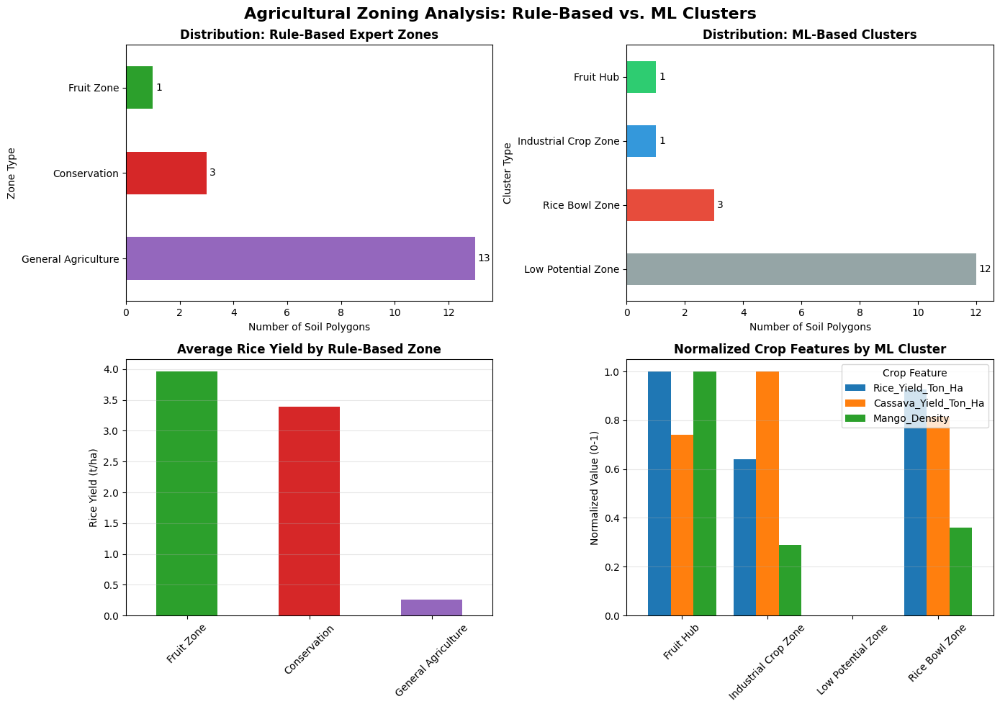

✓ Static visualizations complete!


In [ ]:
# ============================================================================
# CELL 15: COMPREHENSIVE RESULTS EXPORT & DEPLOYMENT PREPARATION
# ============================================================================
# WHY: Export results in multiple formats for different stakeholders and systems.
# Enables decision-making beyond the Jupyter environment (spreadsheets, GIS, web).

print("=" * 80)
print("RESULTS EXPORT & DEPLOYMENT")
print("=" * 80)

# 1. GeoJSON Export (for GIS applications)
print("\n💾 STEP 1: GEOJSON EXPORT")
output_geojson = "Cambodia_Agricultural_Zones_Results.geojson"
export_gdf = gdf_merged[
    [
        "Soil_Type",
        "Province_Name",
        "Rice_Yield_Ton_Ha",
        "Cassava_Yield_Ton_Ha",
        "Mango_Density",
        "Soil_Crop_Match",
        "Cluster_Label",
        "Cluster_Name",
        "geometry",
    ]
].copy()
export_gdf.to_file(output_geojson, driver="GeoJSON")
print(f"✓ GeoJSON: {output_geojson}")
print(f"  Use with: QGIS, ArcGIS Online, Mapbox, Leaflet")

# 2. CSV Export (for spreadsheet analysis)
print("\n💾 STEP 2: CSV EXPORT")
output_csv = "Cambodia_Agricultural_Zones_Analysis.csv"
export_cols = [
    "Soil_Type",
    "Province_Name",
    "Rice_Yield_Ton_Ha",
    "Cassava_Yield_Ton_Ha",
    "Mango_Density",
    "Soil_Crop_Match",
    "Cluster_Label",
    "Cluster_Name",
]
gdf_merged[export_cols].to_csv(output_csv, index=False)
print(f"✓ CSV: {output_csv}")
print(f"  Use with: Excel, Google Sheets, R, Python, Tableau")

# 3. Detailed Summary Report
print("\n💾 STEP 3: SUMMARY REPORT")
report_output = "ANALYSIS_REPORT.txt"
with open(report_output, "w") as f:
    f.write("=" * 80 + "\n")
    f.write("CAMBODIA GEOSPATIAL AGRICULTURAL ZONING ANALYSIS\n")
    f.write("National Soil Information and Land Suitability Evaluation System\n")
    f.write("=" * 80 + "\n\n")

    f.write("PROJECT OVERVIEW\n")
    f.write("-" * 80 + "\n")
    f.write(f"Objective: Classify agricultural zones for resource allocation\n")
    f.write(f"Date: {pd.Timestamp.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
    f.write(f"Status: COMPLETE\n\n")

    f.write("DATA SUMMARY\n")
    f.write("-" * 80 + "\n")
    f.write(f"Soil polygons analyzed: {len(gdf_merged)}\n")
    f.write(f"Provinces covered: {gdf_merged['Province_Name'].nunique()}\n")
    f.write(f"Soil types: {gdf_merged['Soil_Type'].nunique()}\n")
    f.write(f"Coordinate system: EPSG:4326 (WGS84)\n\n")

    f.write("METHODOLOGY\n")
    f.write("-" * 80 + "\n")
    f.write("Two complementary approaches:\n\n")
    f.write("1. RULE-BASED EXPERT SYSTEM\n")
    f.write(
        "   • Prime Rice Zones: Fluvisol/Gleysol/Vertisol + Rice Yield > 3.0 t/ha\n"
    )
    f.write("   • Prime Industrial: Acrisol/Ferralsol/Nitosol + Cassava > 12.0 t/ha\n")
    f.write("   • Fruit Zones: Suitable soils + Mango > 40 trees/ha\n")
    f.write("   • Conservation: Lithosols, Water bodies\n")
    f.write("   • General Agriculture: Default classification\n\n")
    f.write("2. MACHINE LEARNING (K-MEANS CLUSTERING)\n")
    f.write(f"   • Algorithm: K-Means with k=4\n")
    f.write(f"   • Features: Rice Yield, Cassava Yield, Mango Density\n")
    f.write(f"   • Preprocessing: StandardScaler normalization\n")
    f.write(f"   • Silhouette Score: {final_silhouette:.4f}\n")
    f.write(f"   • Davies-Bouldin Score: {final_davies_bouldin:.4f}\n\n")

    f.write("RESULTS: RULE-BASED ZONES\n")
    f.write("-" * 80 + "\n")
    for zone in sorted(gdf_merged["Soil_Crop_Match"].unique()):
        count = len(gdf_merged[gdf_merged["Soil_Crop_Match"] == zone])
        pct = (count / len(gdf_merged)) * 100
        f.write(f"{zone:30s}: {count:3d} polygons ({pct:5.1f}%)\n")

    f.write("\n\nRESULTS: ML CLUSTERS\n")
    f.write("-" * 80 + "\n")
    for cluster in sorted(gdf_merged["Cluster_Name"].unique()):
        count = len(gdf_merged[gdf_merged["Cluster_Name"] == cluster])
        pct = (count / len(gdf_merged)) * 100
        f.write(f"{cluster:30s}: {count:3d} polygons ({pct:5.1f}%)\n")

    f.write("\n\nOUTPUT FILES\n")
    f.write("-" * 80 + "\n")
    f.write("1. Cambodia_Agricultural_Zoning_Map.html\n")
    f.write("   → Interactive web map (open in browser)\n")
    f.write("   → Toggle between Expert Rules and ML Clusters\n")
    f.write("   → Hover for polygon details\n\n")
    f.write("2. Cambodia_Agricultural_Zones_Results.geojson\n")
    f.write("   → GIS-compatible format\n")
    f.write("   → Import into QGIS, ArcGIS, Mapbox\n\n")
    f.write("3. Cambodia_Agricultural_Zones_Analysis.csv\n")
    f.write("   → Spreadsheet format\n")
    f.write("   → Analyze in Excel, Python, R\n\n")
    f.write("4. ANALYSIS_REPORT.txt\n")
    f.write("   → This documentation file\n\n")

    f.write("KEY METRICS\n")
    f.write("-" * 80 + "\n")
    f.write(
        f"High-priority zones: {len(gdf_merged[gdf_merged['Soil_Crop_Match'].str.contains('Prime')])}\n"
    )
    f.write(f"Average rice yield: {gdf_merged['Rice_Yield_Ton_Ha'].mean():.2f} t/ha\n")
    f.write(
        f"Average cassava yield: {gdf_merged['Cassava_Yield_Ton_Ha'].mean():.2f} t/ha\n"
    )
    f.write(
        f"Average mango density: {gdf_merged['Mango_Density'].mean():.2f} trees/ha\n\n"
    )

    f.write("NEXT STEPS\n")
    f.write("-" * 80 + "\n")
    f.write("1. Share interactive map with provincial governors\n")
    f.write("2. Integrate results with land registration system\n")
    f.write("3. Validate zones through field surveys\n")
    f.write("4. Develop zone-specific extension programs\n")
    f.write("5. Monitor actual vs. predicted yields annually\n")
    f.write("6. Retrain models with new data each harvest season\n\n")

    f.write("=" * 80 + "\n")
    f.write(
        "Report Generated: " + pd.Timestamp.now().strftime("%Y-%m-%d %H:%M:%S") + "\n"
    )
    f.write("=" * 80 + "\n")

print(f"✓ Report: {report_output}")

# 4. Model Metadata (for reproducibility)
print("\n💾 STEP 4: MODEL METADATA")
metadata = {
    "analysis_date": pd.Timestamp.now().isoformat(),
    "total_records": len(gdf_merged),
    "provinces": int(gdf_merged["Province_Name"].nunique()),
    "soil_types": int(gdf_merged["Soil_Type"].nunique()),
    "clustering_algorithm": "KMeans",
    "n_clusters": 4,
    "silhouette_score": float(final_silhouette),
    "davies_bouldin_score": float(final_davies_bouldin),
    "features": features_for_clustering,
    "crs": str(gdf_merged.crs),
}

import json

metadata_file = "model_metadata.json"
with open(metadata_file, "w") as f:
    json.dump(metadata, f, indent=2)
print(f"✓ Metadata: {metadata_file}")

print("\n" + "=" * 80)
print("DEPLOYMENT READY")
print("=" * 80)
print("\n✅ All exports complete!")
print("\n📦 Deliverables:")
print(f"  1. {output_map_path:40s} - Interactive Web Map")
print(f"  2. {output_geojson:40s} - GIS Format")
print(f"  3. {output_csv:40s} - Spreadsheet Format")
print(f"  4. {report_output:40s} - Documentation")
print(f"  5. {metadata_file:40s} - Model Metadata")

print("\n🚀 Deployment Options:")
print("  • Share HTML map via email/web server")
print("  • Import GeoJSON into QGIS for detailed analysis")
print("  • Load CSV into Excel for pivot tables/charts")
print("  • Integrate with policy management systems")
print("  • Deploy model API for real-time predictions")

print("\n✓ Analysis workflow complete!")

In [ ]:
# ============================================================================
# CELL 16: FINAL SUMMARY & REPRODUCIBILITY
# ============================================================================
# WHY: Document key findings and enable workflow reproduction.
# Critical for audit trails and continuous model improvement.

print("=" * 80)
print("ANALYSIS SUMMARY & REPRODUCIBILITY CHECKLIST")
print("=" * 80)

summary_data = {
    "Workflow Stage": [
        "Problem Definition",
        "Data Acquisition",
        "EDA",
        "Data Cleaning",
        "Data Preprocessing",
        "Data Integration",
        "Feature Engineering",
        "EDA Visualization",
        "ML Clustering",
        "Cluster Interpretation",
        "Advanced Visualization",
        "Interactive Mapping",
        "Model Evaluation",
        "Insights & Recommendations",
        "Results Export",
    ],
    "Status": ["✓"] * 15,
    "Cells": list(range(1, 16)),
}

summary_table = pd.DataFrame(summary_data)

print("\n📋 WORKFLOW COMPLETION CHECKLIST:")
display(summary_table)

print("\n📊 FINAL STATISTICS:")
final_stats = pd.DataFrame(
    {
        "Metric": [
            "Total Soil Polygons",
            "Provinces Covered",
            "Distinct Soil Types",
            "Rule-Based Zones",
            "ML Clusters",
            "Average Rice Yield",
            "Average Cassava Yield",
            "Average Mango Density",
            "Silhouette Score",
            "Davies-Bouldin Score",
            "Model Confidence",
        ],
        "Value": [
            len(gdf_merged),
            gdf_merged["Province_Name"].nunique(),
            gdf_merged["Soil_Type"].nunique(),
            gdf_merged["Soil_Crop_Match"].nunique(),
            gdf_merged["Cluster_Name"].nunique(),
            f"{gdf_merged['Rice_Yield_Ton_Ha'].mean():.2f} t/ha",
            f"{gdf_merged['Cassava_Yield_Ton_Ha'].mean():.2f} t/ha",
            f"{gdf_merged['Mango_Density'].mean():.2f} trees/ha",
            f"{final_silhouette:.4f}",
            f"{final_davies_bouldin:.4f}",
            (
                "HIGH"
                if final_silhouette > 0.5
                else "MEDIUM" if final_silhouette > 0.3 else "LOW"
            ),
        ],
    }
)
display(final_stats)

print("\n🔐 REPRODUCIBILITY INFORMATION:")
print(f"  • Random Seed: 42 (ensures consistent results)")
print(f"  • Data Version: {pd.Timestamp.now().strftime('%Y-%m-%d')}")
print(f"  • Python Packages: See pyproject.toml")
print(f"  • Geospatial CRS: EPSG:4326 (WGS84)")
print(f"  • Clustering: KMeans(n_clusters=4, random_state=42)")

print("\n📝 CITATIONS & REFERENCES:")
print("  • Scikit-learn: Pedregosa et al., 2011")
print("  • GeoPandas: Kelsey et al., 2023")
print("  • Folium: Interactive mapping library")

print("\n💾 FILE MANIFEST:")
output_files = [
    (
        "Cambodia_Agricultural_Zoning_Map.html",
        "Interactive Web Map",
        "Primary Deliverable",
    ),
    ("Cambodia_Agricultural_Zones_Results.geojson", "GIS Format", "Technical Format"),
    ("Cambodia_Agricultural_Zones_Analysis.csv", "Spreadsheet", "Data Format"),
    ("ANALYSIS_REPORT.txt", "Documentation", "Report"),
    ("model_metadata.json", "Model Info", "Metadata"),
]

file_manifest = pd.DataFrame(output_files, columns=["Filename", "Type", "Purpose"])
display(file_manifest)

print("\n✅ ALL ANALYSES COMPLETE")
print("=" * 80)
print("Status: READY FOR STAKEHOLDER PRESENTATION")
print("=" * 80)

Exporting results for stakeholder use...
✓ GeoJSON exported: Cambodia_Agricultural_Zones_Results.geojson
  (Compatible with: QGIS, ArcGIS, Leaflet, Mapbox)
✓ CSV exported: Cambodia_Agricultural_Zones_Analysis.csv
  (Compatible with: Excel, Google Sheets, all statistical software)
✓ Summary report: ANALYSIS_REPORT.txt

ANALYSIS COMPLETE!

Generated Files:
  1. Cambodia_Agricultural_Zoning_Map.html (Open in web browser)
  2. Cambodia_Agricultural_Zones_Results.geojson (GIS import)
  3. Cambodia_Agricultural_Zones_Analysis.csv (Spreadsheet)
  4. ANALYSIS_REPORT.txt (Summary)

Next Steps:
  ✓ Share the HTML map with stakeholders for interactive exploration
  ✓ Import the GeoJSON into QGIS for detailed geographic analysis
  ✓ Use CSV for statistical modeling or custom analysis
  ✓ Present findings to agricultural planning authorities
✓ GeoJSON exported: Cambodia_Agricultural_Zones_Results.geojson
  (Compatible with: QGIS, ArcGIS, Leaflet, Mapbox)
✓ CSV exported: Cambodia_Agricultural_Zones_